# Optimizing Prices Based on Demand Elasticity

Determining the ideal price for a product is a critical aspect of any business, involving careful consideration and various strategies for different product types. Some products have sales that are highly sensitive to price changes, resulting in significant sales fluctuations due to minor price adjustments. On the other hand, some products, such as luxury items or necessities like certain medications, are not significantly impacted by price changes. This analysis will focus on products with price-sensitive sales.

Demand price elasticity (Epd) represents the extent to which consumer demand for a product shifts as its price changes. Generally, as a product becomes more expensive, consumer desire for it decreases. However, the drop in customer desire may vary depending on the product; for some, even a slight price increase can cause a significant decline in demand, while others may experience little change in demand despite substantial price hikes. Economists use the term "elasticity" to describe this price sensitivity. More specifically, price elasticity measures the percentage change in quantity demanded in response to a one percent price increase, with all other factors held constant.

Mathematically, price elasticity of demand is defined as the percentage change in quantity demanded (q) divided by the percentage change in price (p). The formula for price elasticity (ε) is: 
$$e = \%ΔQ/ \%ΔP$$

In this study, we will analyze the sales of a cafe that offers items such as burgers, coke, lemonade, and coffee. As data scientists, our objective is to determine the optimal prices for these items. Setting prices too high will lead to decreased sales, while setting them too low will reduce profit margins. Our goal is to identify the sweet spot that maximizes profitability.

### Price Elasticity
Price elasticity refers to the degree to which the quantity demanded of a product or service changes in response to a change in its price. Specifically, price elasticity measures the percentage change in the quantity demanded of a product or service relative to a percentage change in its price.

If the quantity demanded of a product or service is highly sensitive to changes in its price, we say that the product or service is "price elastic." In other words, a small change in price will lead to a relatively large change in the quantity demanded.

On the other hand, if the quantity demanded is relatively insensitive to changes in price, we say that the product or service is "price inelastic." In this case, a change in price will have a relatively small effect on the quantity demanded.

Price elasticity is an important concept in economics, as it helps businesses and policymakers to understand how changes in price may affect the demand for a particular product or service. By measuring price elasticity, businesses can make more informed decisions about pricing strategies, while policymakers can use this information to design more effective policies related to taxation, subsidies, and other economic interventions.

### Price Optimization
Price optimization is the process of setting the optimal price for a product or service to maximize profits or revenue. It involves analyzing customer behavior, market conditions, and other relevant factors to determine the optimal price that will generate the highest level of demand while also maximizing profitability.

Price optimization relies on data-driven analysis and modeling techniques to identify the most effective pricing strategies. These may include dynamic pricing, which involves adjusting prices in real-time based on changes in demand or market conditions, or segmentation-based pricing, which involves setting different prices for different customer segments based on their willingness to pay.

Price optimization can be used in a variety of industries, including retail, e-commerce, hospitality, and transportation. It can help businesses to increase their profits, improve customer satisfaction, and gain a competitive advantage by offering the most attractive prices in the market.


Goals
- Through Analysis gain insights to customers price sensitivity
- Optimize Prices to increase revenue, and, profit.


Stratgies to Price Products
- Cost plus pricing (total cost + %)
- Competition based pricing 
- Percieved value based pricing
- Demand Based Pricing
- Price Elasticity Pricing

### Import Libraries, Set the interactive shell mode in a Jupyter Notebook,  Set the warning configuration, Set display options for a Pandas DataFrame,

In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="ticks", color_codes=True)

In [2]:
## Get multiple outputs in the same cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Ignore all warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

In [3]:
# Display all of the row and columns of a dataframe insteaf os a truncated version
from IPython.display import display
pd.set_option ('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Load Data and familiarize with data sets

Sales Data

In [4]:
#Load sales data
sold = pd.read_csv('Cafe_Sell_Meta_Data.csv')

In [5]:
#Load transaction data
transactions = pd.read_csv('Cafe_Transaction_Store.csv')

In [6]:
#Load date data
date_info = pd.read_csv('Cafe_Date_Info.csv')

In [7]:
# to ensure that sales data load and familiarize self with data 
sold.head()

,SELL_ID,SELL_CATEGORY,ITEM_ID,ITEM_NAME
0,1070,0,7821,BURGER
1,3055,0,3052,COFFEE
2,3067,0,5030,COKE
3,3028,0,6249,LEMONADE
4,2051,2,7821,BURGER


In [8]:
# provide summary statistics for each column

sold.describe()
sold.describe(include = ['O'])

,SELL_ID,SELL_CATEGORY,ITEM_ID
count,11.000000,11.000000,11.000000
mean,2235.000000,1.272727,5906.909091
std,598.728653,1.009050,1830.217170
min,1070.000000,0.000000,3052.000000
25%,2051.500000,0.000000,5030.000000
50%,2053.000000,2.000000,6249.000000
75%,2540.500000,2.000000,7821.000000
max,3067.000000,2.000000,7821.000000


,ITEM_NAME
count,11
unique,4
top,BURGER
freq,4


We can see that there are 11 observations in the DataFrame, with a mean SELL_ID value of 2235 and a standard deviation of 598.7. The SELL_CATEGORY column is a categorical variable with three unique values: 0, 1, and 2. The ITEM_ID column has a mean value of 5906.9 and a standard deviation of 1830.2.

The ITEM_NAME column has 11 non-null values, with 4 unique values: 'BURGER', 'COKE', 'FRIES', and 'NUGGETS'. 'BURGER' is the most frequent value, with a frequency of 4.

In [9]:
#check for null values
sold[sold.isnull().any(axis = 1)]

,SELL_ID,SELL_CATEGORY,ITEM_ID,ITEM_NAME


No known null values in the sales data

SELL_ID: a categorical variable identifying the combination of items contained in each product.

SELL_CATEGORY: a categorical variable where "0" identifies single products and "2" identifies combo products.

ITEM_ID: a categorical variable identifying the individual item contained in each product.

ITEM_NAME: a categorical variable identifying the name of each item in the product.

Create a pairwise scatter plot matrix using the Seaborn library to futher understand the relationship between different variables

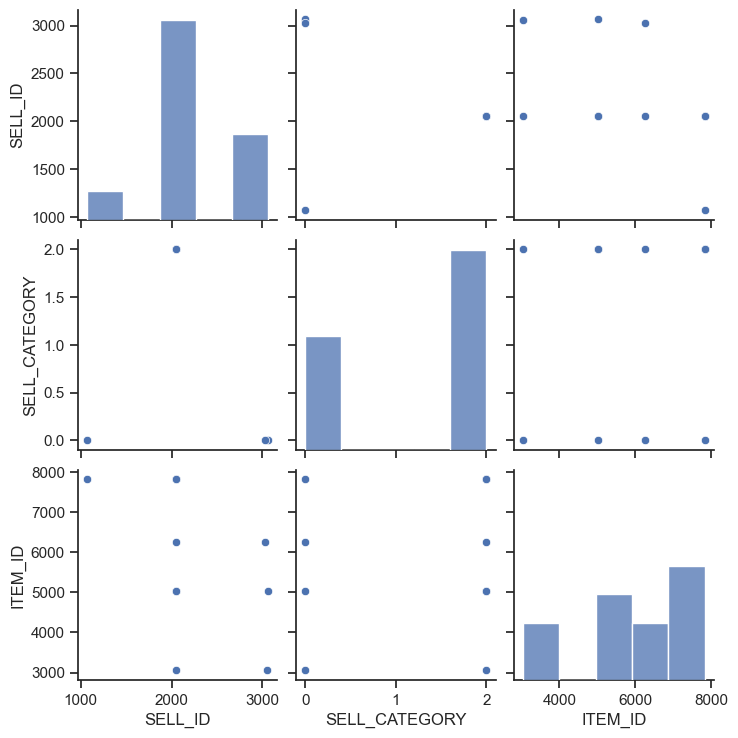

In [10]:
sns.pairplot(sold)

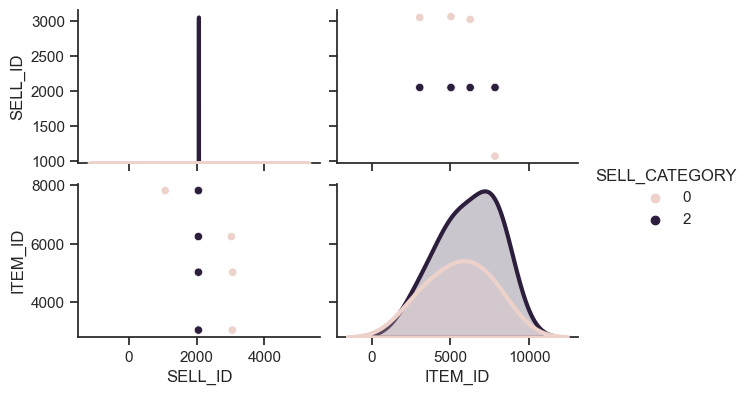

In [11]:
sns.pairplot(sold, hue='SELL_CATEGORY', markers='o', height=2, aspect=1.5, diag_kws={'linewidth':3})

### Transactions data

In [12]:
# to ensure that transaction data properly load and to familiarize with data  
transactions.head()

,CALENDAR_DATE,PRICE,QUANTITY,SELL_ID,SELL_CATEGORY
0,01/01/12,15.50,46,1070,0
1,01/01/12,12.73,22,2051,2
2,01/01/12,12.75,18,2052,2
3,01/01/12,12.60,30,2053,2
4,01/02/12,15.50,70,1070,0


In [13]:
# provide summary statistics for each column
transactions.describe()
transactions.describe(include = ['O'])

,PRICE,QUANTITY,SELL_ID,SELL_CATEGORY
count,5404.000000,5404.000000,5404.00000,5404.000000
mean,12.868729,44.335307,1806.50000,1.500000
std,1.563922,25.502597,425.25841,0.866106
min,10.120000,8.000000,1070.00000,0.000000
25%,11.530000,24.000000,1805.75000,1.500000
50%,12.640000,36.000000,2051.50000,2.000000
75%,13.557500,60.000000,2052.25000,2.000000
max,16.500000,124.000000,2053.00000,2.000000


,CALENDAR_DATE
count,5404
unique,1348
top,03/01/13
freq,16


There are 5404 non-missing values in the CALENDAR_DATE column, with 1348 unique values. The most frequently occurring date is '03/01/13', which occurs 16 times in the column.

These summary statistics can provide insight into the distribution and characteristics of the data in each column, as well as any potential issues or outliers in the data.

In [14]:
# check for nulls
transactions[transactions.isnull().any(axis = 1)]

,CALENDAR_DATE,PRICE,QUANTITY,SELL_ID,SELL_CATEGORY


No indicated null values in the transactions data

The assumption is that the PRICE for each product sold on a given day remains constant. The data includes the following variables:

CALENDAR_DATE: a date/time variable, where the time component is always set to 00:00 AM.

PRICE: a numerical variable indicating the price of the product identified by the SELL_ID.

QUANTITY: a numerical variable indicating the quantity of the product sold, identified by the SELL_ID.

SELL_ID: a categorical variable identifying the product sold.

SELL_CATEGORY: a categorical variable indicating the category of the product sold.

(array([ 360.,  509.,  629., 1351., 1082.,  122.,  389.,  240.,  482.,
         240.]),
 array([10.12 , 10.758, 11.396, 12.034, 12.672, 13.31 , 13.948, 14.586,
        15.224, 15.862, 16.5  ]),
 <BarContainer object of 10 artists>)

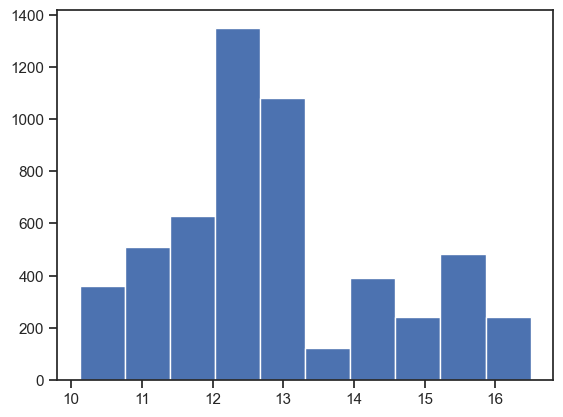

In [15]:
#To gain insight into the distribution of prices in the dataset
plt.hist(transactions.PRICE)

Create a pairwise scatter plot matrix using the Seaborn library to futher understand the relationship between different variables

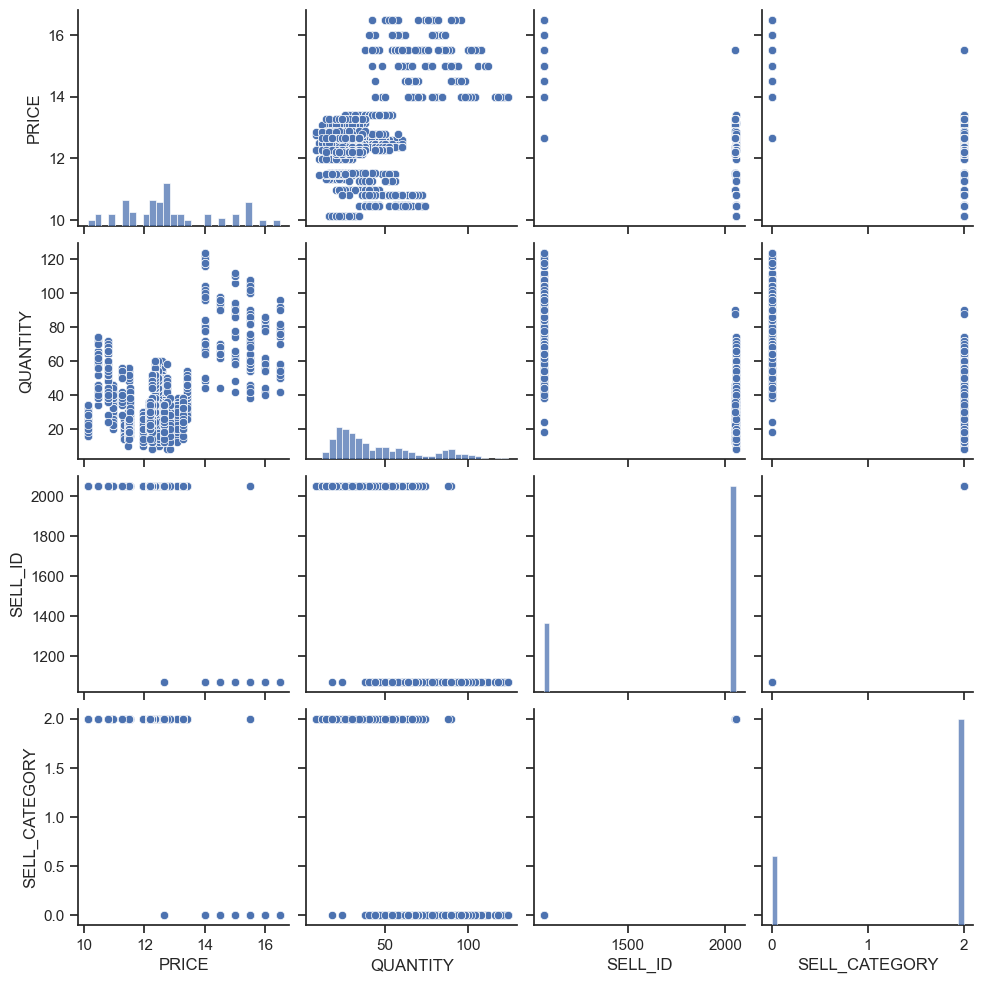

In [16]:
sns.pairplot(transactions)

### Data Info
CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,
AVERAGE_TEMPERATURE,IS_OUTDOOR

In [17]:
#familiarize with the structure of the data
date_info.head()

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1/1/12,2012,New Year,1,0,24.8,0
1,1/2/12,2012,New Year,0,0,24.8,0
2,1/3/12,2012,New Year,0,0,32.0,1
3,1/4/12,2012,NaN,0,0,32.0,1
4,1/5/12,2012,NaN,0,0,24.8,0


In [18]:
# provide summary statistics for each column
date_info.describe()
date_info.describe(include = ['O'])

,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,1349.000000,1349.000000,1349.000000,1349.000000,1349.000000
mean,2013.375093,0.285397,0.204596,56.326019,0.862120
std,1.073073,0.451771,0.403556,20.227597,0.344902
min,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2013.000000,0.000000,0.000000,60.800000,1.000000
75%,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2015.000000,1.000000,1.000000,87.800000,1.000000


,CALENDAR_DATE,HOLIDAY
count,1349,105
unique,1348,8
top,3/1/13,Luner New Year
freq,2,28


In [19]:
#determine what type of datatypes you are working with
date_info.dtypes

CALENDAR_DATE           object
YEAR                     int64
HOLIDAY                 object
IS_WEEKEND               int64
IS_SCHOOLBREAK           int64
AVERAGE_TEMPERATURE    float64
IS_OUTDOOR               int64
dtype: object

In [20]:
# check for null
date_info[date_info.isnull().any(axis=1)]

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
3,1/4/12,2012,NaN,0,0,32.0,1
4,1/5/12,2012,NaN,0,0,24.8,0
5,1/6/12,2012,NaN,0,0,23.0,0
6,1/7/12,2012,NaN,1,0,26.6,0
7,1/8/12,2012,NaN,1,0,26.6,0
8,1/9/12,2012,NaN,0,0,23.0,0
9,1/10/12,2012,NaN,0,0,24.8,0
10,1/11/12,2012,NaN,0,0,21.2,0
11,1/12/12,2012,NaN,0,0,24.8,0
12,1/13/12,2012,NaN,0,0,26.6,0


This code  is checking for null values in the DataFrame called date_info with the holiday column returning multiple null values.  Need to replace null values with "Not a Holiday" to create a more accurate representation of data.

In [21]:
date_info['HOLIDAY'] = date_info['HOLIDAY'].fillna("Not A Holiday")

In [22]:
#ensure change has been made
date_info

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1/1/12,2012,New Year,1,0,24.8,0
1,1/2/12,2012,New Year,0,0,24.8,0
2,1/3/12,2012,New Year,0,0,32.0,1
3,1/4/12,2012,Not A Holiday,0,0,32.0,1
4,1/5/12,2012,Not A Holiday,0,0,24.8,0
5,1/6/12,2012,Not A Holiday,0,0,23.0,0
6,1/7/12,2012,Not A Holiday,1,0,26.6,0
7,1/8/12,2012,Not A Holiday,1,0,26.6,0
8,1/9/12,2012,Not A Holiday,0,0,23.0,0
9,1/10/12,2012,Not A Holiday,0,0,24.8,0


Create a pairwise scatter plot matrix using the Seaborn library to futher understand the relationship between different variables

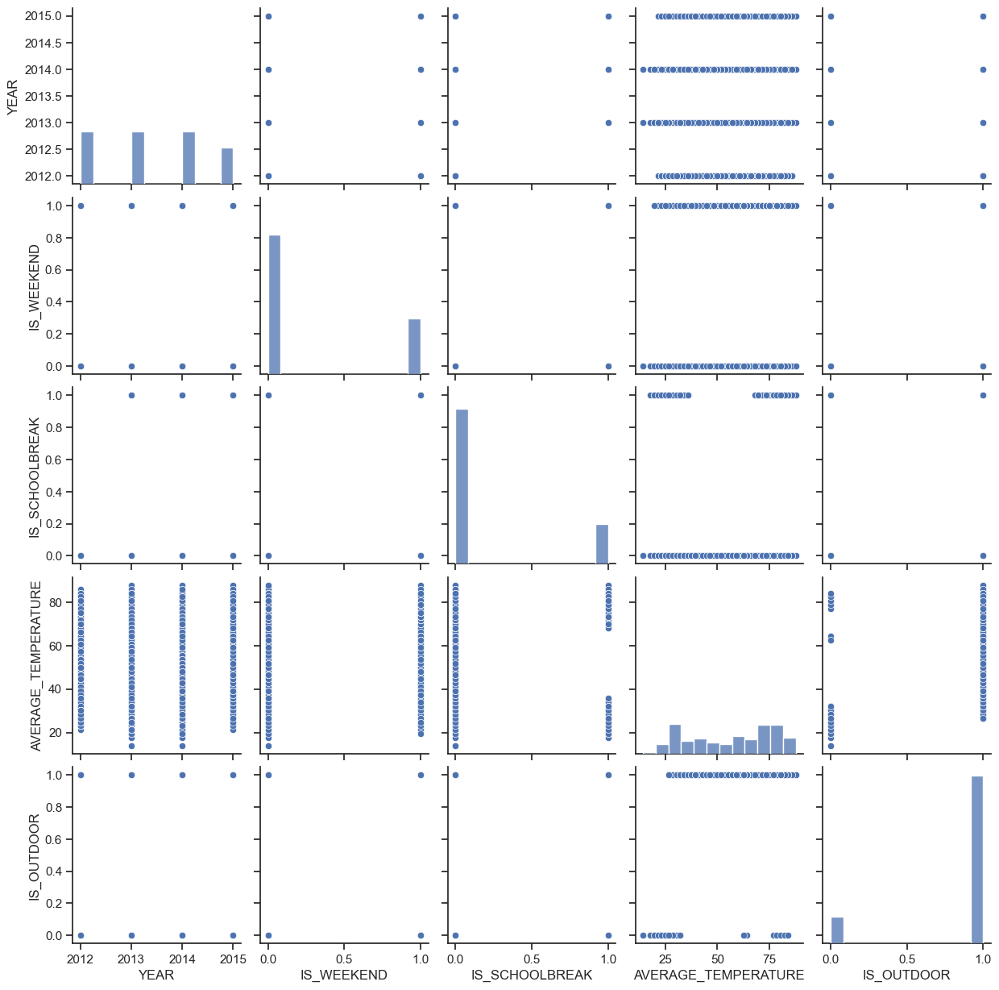

In [23]:
sns.pairplot(date_info)

### Go Deeper in Understanding the Code You are Working With

In [24]:
#check for the unique values held within the date_info dataset
np.unique(date_info['HOLIDAY'])

array(['Dragon Boat Festivel', 'Labor Day', 'Luner New Year',
       'Mid-Autumn Day', 'National Day', 'New Year', 'Not A Holiday',
       'Qing Ming Festival', 'WWII Celebration'], dtype=object)

In [25]:
# earliest date
date_info['CALENDAR_DATE'].min()

'1/1/12'

In [26]:
# Latest date
date_info['CALENDAR_DATE'].max()

'9/9/15'

In [27]:
# shape of data
date_info.shape

(1349, 7)

In [28]:
# check for null
date_info[date_info.isnull().any(axis=1)]

,CALENDAR_DATE,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


### Concatenate SELL_ID and ITEM_NAME

Lets concatenate two dataframes using the pd.concat() function from the Pandas library in Python.

The first dataframe is a column from the sold dataframe called SELL_ID, which contains unique identifiers for items sold. The second dataframe is created by applying the pd.get_dummies() function to the ITEM_NAME column of the sold dataframe.

In [29]:
# concatenate the SELL_ID and ITEM_NAME
pd.concat([sold.SELL_ID, pd.get_dummies(sold.ITEM_NAME)], axis=1)

,SELL_ID,BURGER,COFFEE,COKE,LEMONADE
0,1070,True,False,False,False
1,3055,False,True,False,False
2,3067,False,False,True,False
3,3028,False,False,False,True
4,2051,True,False,False,False
5,2051,False,False,True,False
6,2052,True,False,False,False
7,2052,False,False,False,True
8,2053,True,False,False,False
9,2053,False,False,True,False


The results shown are an example of the concatenated dataframe. Each row corresponds to a different item sold, and the columns show whether that item had each of the different ITEM_NAME values in the original sold dataframe. For example, the first item sold (with SELL_ID 1070) had the BURGER ITEM_NAME, but not the COFFEE, COKE, or LEMONADE ITEM_NAMEs. Conversely, the second item sold (with SELL_ID 3055) had the COFFEE ITEM_NAME, but not the others. The boolean True or False values indicate whether each ITEM_NAME was present in the original sold dataframe for that particular row.

In [30]:
#The next step is to create a one-hot encoded representation of the ITEM_NAME column in the sold dataframe and group the 
#resulting dataframe by SELL_ID. This allows us to see which ITEM_NAMEs are typically sold together and how often they appear 
#in the dataset. The resulting dataframe can be used for market basket analysis or other similar tasks.
pd.concat([sold.SELL_ID, pd.get_dummies(sold.ITEM_NAME)], axis=1).groupby(sold.SELL_ID).sum()

,SELL_ID,BURGER,COFFEE,COKE,LEMONADE
SELL_ID,,,,,
1070,1070,1,0,0,0
2051,4102,1,0,1,0
2052,4104,1,0,0,1
2053,6159,1,1,1,0
3028,3028,0,0,0,1
3055,3055,0,1,0,0
3067,3067,0,0,1,0


### Merge the Data

In [31]:
data1 = pd.merge(sold.drop(['ITEM_ID'],axis=1), transactions.drop(['SELL_CATEGORY'], axis= 1), on =  'SELL_ID')
data1.head(20)
b = data1.groupby(['SELL_ID', 'SELL_CATEGORY', 'ITEM_NAME', 'CALENDAR_DATE','PRICE']).QUANTITY.sum()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY
0,1070,0,BURGER,01/01/12,15.5,46
1,1070,0,BURGER,01/02/12,15.5,70
2,1070,0,BURGER,01/03/12,15.5,62
3,1070,0,BURGER,01/04/12,15.5,88
4,1070,0,BURGER,01/05/12,15.5,104
5,1070,0,BURGER,01/06/12,15.5,100
6,1070,0,BURGER,01/07/12,15.5,70
7,1070,0,BURGER,01/08/12,15.5,70
8,1070,0,BURGER,01/09/12,15.5,106
9,1070,0,BURGER,01/10/12,15.5,108


In [32]:
b

SELL_ID  SELL_CATEGORY  ITEM_NAME  CALENDAR_DATE  PRICE
1070     0              BURGER     01/01/12       15.50     46
                                   01/01/13       15.50     60
                                   01/01/14       15.50     72
                                   01/01/15       14.00     66
                                   01/02/12       15.50     70
                                   01/02/13       15.50     68
                                   01/02/14       15.50     76
                                   01/02/15       14.00    102
                                   01/03/12       15.50     62
                                   01/03/13       15.50     70
                                   01/03/14       15.50     68
                                   01/03/15       14.00     68
                                   01/04/12       15.50     88
                                   01/04/13       15.50    100
                                   01/04/14       15.50     74

b: The output shows a tabular data representation with columns SELL_ID, SELL_CATEGORY, ITEM_NAME, CALENDAR_DATE, PRICE, and a multi-level index with the first level being SELL_ID. The data in the table represent sales data with information on the quantity sold (QUANTITY) for different items (ITEM_NAME) on different dates (CALENDAR_DATE) and at different prices (PRICE).

In [33]:
#check the shape of the merged data
data1.shape 

# reset the index of the dataframe to a numerical index and move any existing index levels into columns, 
#creating a new column in the resulting dataframe for each index level.
intermediate_data = b.reset_index()

(10808, 6)

In [34]:
# check the shape
data1.shape

(10808, 6)

In [35]:
#check the shape of b dataframe
b.shape

(10792,)

In [36]:
# first 5 rows
intermediate_data.head()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY
0,1070,0,BURGER,01/01/12,15.5,46
1,1070,0,BURGER,01/01/13,15.5,60
2,1070,0,BURGER,01/01/14,15.5,72
3,1070,0,BURGER,01/01/15,14.0,66
4,1070,0,BURGER,01/02/12,15.5,70


In [38]:
# Check earliest date
intermediate_data['CALENDAR_DATE'].min()

'01/01/12'

In [39]:
# Check the latest date
intermediate_data['CALENDAR_DATE'].max()

'9/30/14'

### Merge CALENDAR_DATE Data

In [40]:
# merge the data
combined_data = pd.merge(intermediate_data, date_info, on = 'CALENDAR_DATE')
combined_data.head(100)

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
2,2051,2,COKE,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
5,2053,2,BURGER,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
6,2053,2,COFFEE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
7,2053,2,COKE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
8,1070,0,BURGER,1/13/13,15.50,70,2013,Not A Holiday,1,0,30.2,0
9,2051,2,BURGER,1/13/13,13.13,26,2013,Not A Holiday,1,0,30.2,0


In [41]:
# check for the shape
combined_data.shape

(6696, 12)

In [42]:
combined_data

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
2,2051,2,COKE,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
5,2053,2,BURGER,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
6,2053,2,COFFEE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
7,2053,2,COKE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
8,1070,0,BURGER,1/13/13,15.50,70,2013,Not A Holiday,1,0,30.2,0
9,2051,2,BURGER,1/13/13,13.13,26,2013,Not A Holiday,1,0,30.2,0


In [43]:
# exploratory data analysis and quality assurance checks on their data, identify problematic or incomplete rows, and 
# decide how to handle the missing data (e.g., by imputing values or removing the rows).
combined_data[combined_data.isnull().any(axis=1)]

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


In [44]:
#determine the unique values of the HOLIDAY, IS_WEEKEND, and IS_SCHOOLBREAK columns in the combined_data
np.unique(combined_data['HOLIDAY'])
np.unique(combined_data['IS_WEEKEND'])
np.unique(combined_data['IS_SCHOOLBREAK'])

array(['Dragon Boat Festivel', 'Labor Day', 'Luner New Year',
       'Mid-Autumn Day', 'Not A Holiday'], dtype=object)

array([0, 1], dtype=int64)

array([0, 1], dtype=int64)

create a new Pandas dataframe called bau_data that includes only the rows from the original combined_data dataframe where three conditions are met:

The value in the HOLIDAY column is "No Holiday"
The value in the IS_SCHOOLBREAK column is 0
The value in the IS_WEEKEND column is 0

In [45]:
bau_data = combined_data[(combined_data['HOLIDAY']=='Not A Holiday') & (combined_data['IS_SCHOOLBREAK']==0) & (combined_data['IS_WEEKEND']==0)]

In [46]:
bau_data.head()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
2,2051,2,COKE,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0


In [47]:
bau_data.shape

(3768, 12)

In [48]:
# check for unique
np.unique(bau_data['HOLIDAY'])
np.unique(bau_data['IS_WEEKEND'])
np.unique(bau_data['IS_SCHOOLBREAK'])

array(['Not A Holiday'], dtype=object)

array([0], dtype=int64)

array([0], dtype=int64)

In [49]:
#filter the Pandas dataframe to include only rows where the value in the IS_WEEKEND column is equal to 1.
bau_data[bau_data['IS_WEEKEND']==1]

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR


In [50]:
bau_data[bau_data['HOLIDAY']!='No Holiday']

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
2,2051,2,COKE,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
5,2053,2,BURGER,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
6,2053,2,COFFEE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
7,2053,2,COKE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
16,1070,0,BURGER,1/13/14,15.50,104,2014,Not A Holiday,0,0,28.4,0
17,2051,2,BURGER,1/13/14,13.27,38,2014,Not A Holiday,0,0,28.4,0


(array([1884.,    0.,    0.,  942.,    0.,    0.,  471.,    0.,    0.,
         471.]),
 array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. ]),
 <BarContainer object of 10 artists>)

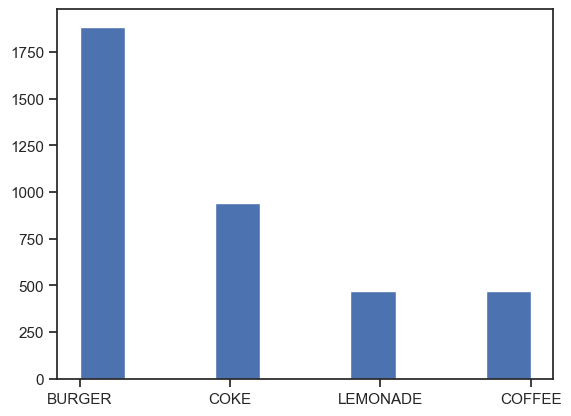

In [51]:
# Data exploration
plt.hist(bau_data.ITEM_NAME)

(array([ 411.,  388.,  441., 1159.,  790.,  108.,  122.,  111.,  174.,
          64.]),
 array([10.12 , 10.758, 11.396, 12.034, 12.672, 13.31 , 13.948, 14.586,
        15.224, 15.862, 16.5  ]),
 <BarContainer object of 10 artists>)

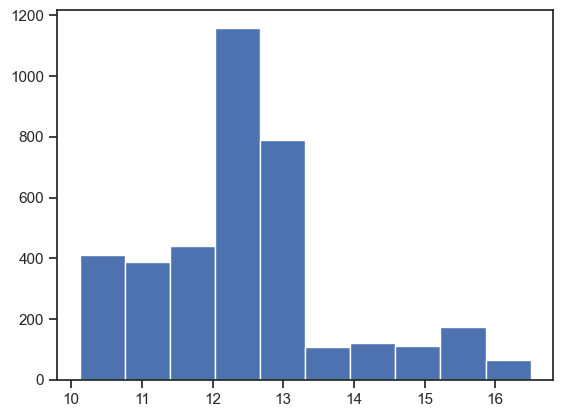

In [52]:
# histogram plot
plt.hist(bau_data.PRICE)

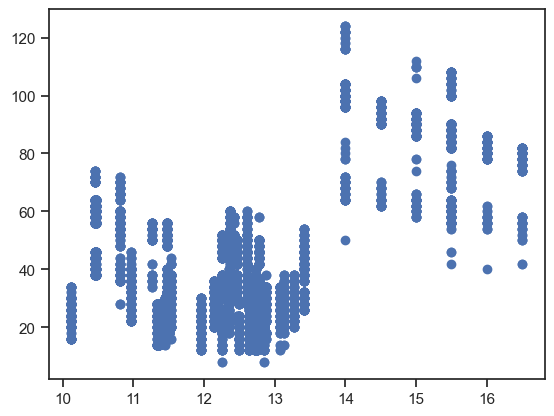

In [53]:
# scatter plot 
plt.scatter(combined_data['PRICE'], combined_data['QUANTITY'])

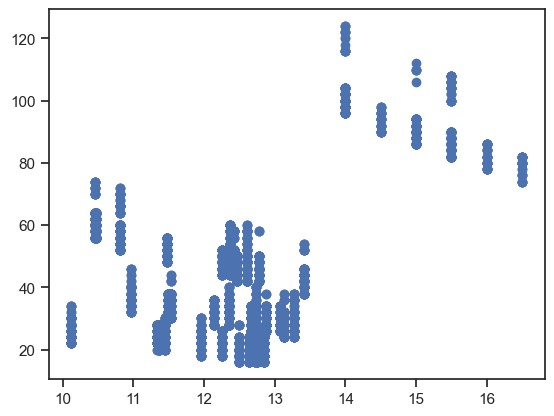

In [54]:
# scatter plot 
plt.scatter(bau_data['PRICE'], bau_data['QUANTITY'])

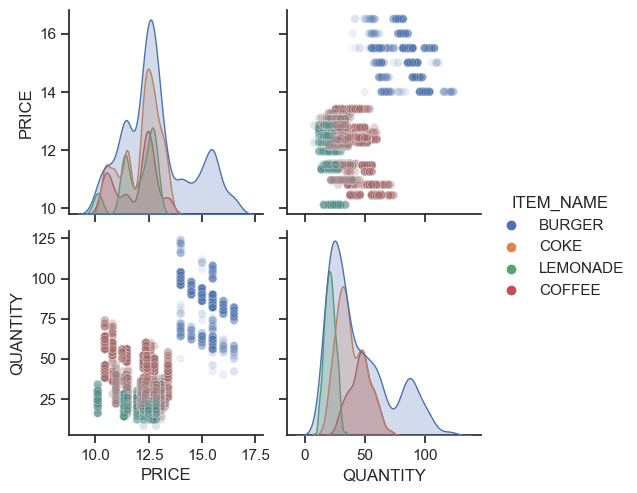

In [55]:
# this code is to create a scatterplot matrix of the variables PRICE, QUANTITY, and ITEM_NAME using Seaborn, a data visualization library in Python.
sns.pairplot(combined_data[['PRICE','QUANTITY','ITEM_NAME']], hue = 'ITEM_NAME', plot_kws={'alpha':0.1})

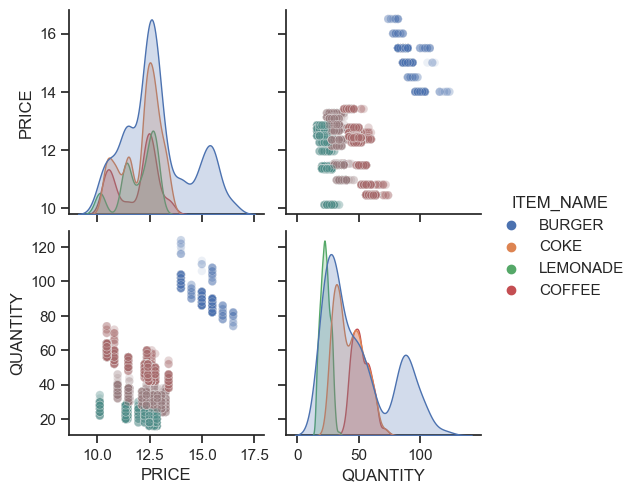

In [56]:
sns.pairplot(bau_data[['PRICE','QUANTITY','ITEM_NAME']], hue = 'ITEM_NAME', plot_kws={'alpha':0.1})

The density plot of prices has two peaks, indicating a bimodal distribution. It is evident from the plot that the quantity sold decreases as the price increases, for all products except coke which is not visible in this view. We can proceed to calculate the price elasticities for further analysis.

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
5,2053,2,BURGER,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
8,1070,0,BURGER,1/13/13,15.50,70,2013,Not A Holiday,1,0,30.2,0


(3348, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,3348.000000,3348.000000,3348.000000,3348.000000,3348.000000,3348.000000,3348.000000,3348.000000,3348.000000
mean,1806.500000,1.500000,12.858572,44.974313,2013.351254,0.284349,0.200717,56.255914,0.878136
std,425.282579,0.866155,1.565046,25.747886,1.062567,0.451171,0.400596,19.996348,0.327177
min,1070.000000,0.000000,10.120000,8.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,1805.750000,1.500000,11.530000,24.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2051.500000,2.000000,12.640000,36.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2052.250000,2.000000,13.557500,60.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2053.000000,2.000000,16.500000,124.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

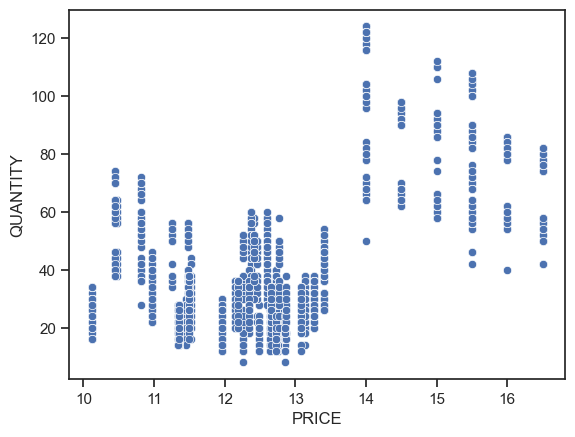

In [57]:
# analyzes the sales data for burgers in the combined_data Pandas dataframe.
burger = combined_data[combined_data['ITEM_NAME'] == 'BURGER']
burger.head()
burger.shape
burger.describe()
sns.scatterplot(x = burger.PRICE, y = burger.QUANTITY )

The scatter plot above suggests that there may be multiple types of burgers being sold. To explore this further, we can examine the distribution of burger sales when differentiated by SELL_ID, which indicates whether the burger was part of a combo and should be analyzed separately.

<Axes: xlabel='PRICE', ylabel='QUANTITY'>

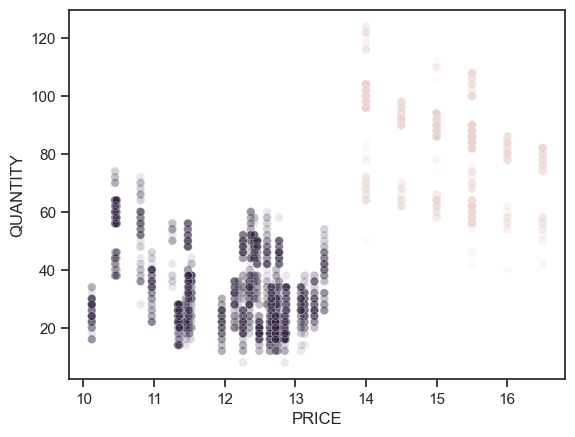

In [58]:
# explore the relationships between the PRICE, QUANTITY, and SELL_ID columns in the burger sales data using a scatter plot. 
burger = combined_data[combined_data['ITEM_NAME'] == 'BURGER']
# print(burger)
# print(burger.describe())
sns.scatterplot(data = burger, x = burger.PRICE, y = burger.QUANTITY , hue = 'SELL_ID', legend=False, alpha = 0.1)

In [59]:
#Extract the unique values from the SELL_ID column of the combined_data dataframe using the NumPy np.unique() function.
np.unique(combined_data.SELL_ID)

array([1070, 2051, 2052, 2053], dtype=int64)

In [60]:
np.unique(combined_data.SELL_CATEGORY)

array([0, 2], dtype=int64)

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.5,100,2012,Not A Holiday,0,0,26.6,0
8,1070,0,BURGER,1/13/13,15.5,70,2013,Not A Holiday,1,0,30.2,0
16,1070,0,BURGER,1/13/14,15.5,104,2014,Not A Holiday,0,0,28.4,0
24,1070,0,BURGER,1/13/15,14.0,116,2015,Not A Holiday,0,0,28.4,0
32,1070,0,BURGER,1/14/12,15.5,74,2012,Not A Holiday,1,0,23.0,0


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,1070.0,0.0,15.154719,82.685783,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.744770,15.981238,1.063043,0.451373,0.400776,20.005316,0.327324
min,1070.0,0.0,14.000000,40.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,1070.0,0.0,14.500000,68.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,1070.0,0.0,15.500000,86.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,1070.0,0.0,15.500000,92.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,1070.0,0.0,16.500000,124.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

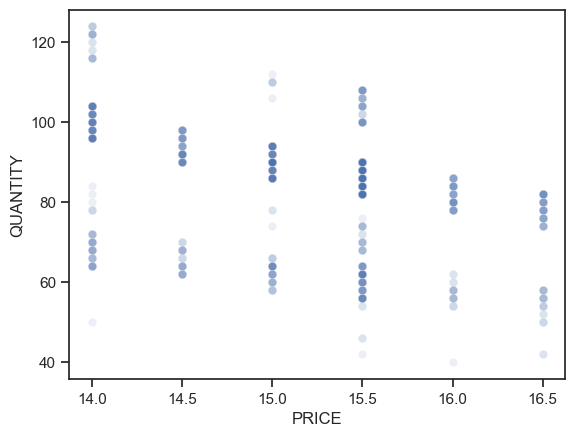

In [61]:
#explore the relationships between the PRICE and QUANTITY columns in the burger_1070 sales data using a scatter plot
burger_1070 = combined_data[(combined_data['ITEM_NAME'] == 'BURGER') & (combined_data['SELL_ID'] == 1070)]

burger_1070.head()
burger_1070.describe()
sns.scatterplot(data = burger_1070, x = burger_1070.PRICE, y = burger_1070.QUANTITY, alpha = 0.1)

### Now Model the Price and Quantity Data

model the code using a regression model to the PRICE and QUANTITY columns of the burger_1070 dataframe, and to visualize the relationship between these variables while controlling for the effects of other variables in the model.

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.156
Model:                            OLS   Adj. R-squared:                  0.155
Method:                 Least Squares   F-statistic:                     153.9
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           1.45e-32
Time:                        18:38:09   Log-Likelihood:                -3436.0
No. Observations:                 837   AIC:                             6876.
Df Residuals:                     835   BIC:                             6885.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    210.9859     10.353     20.379      0.0

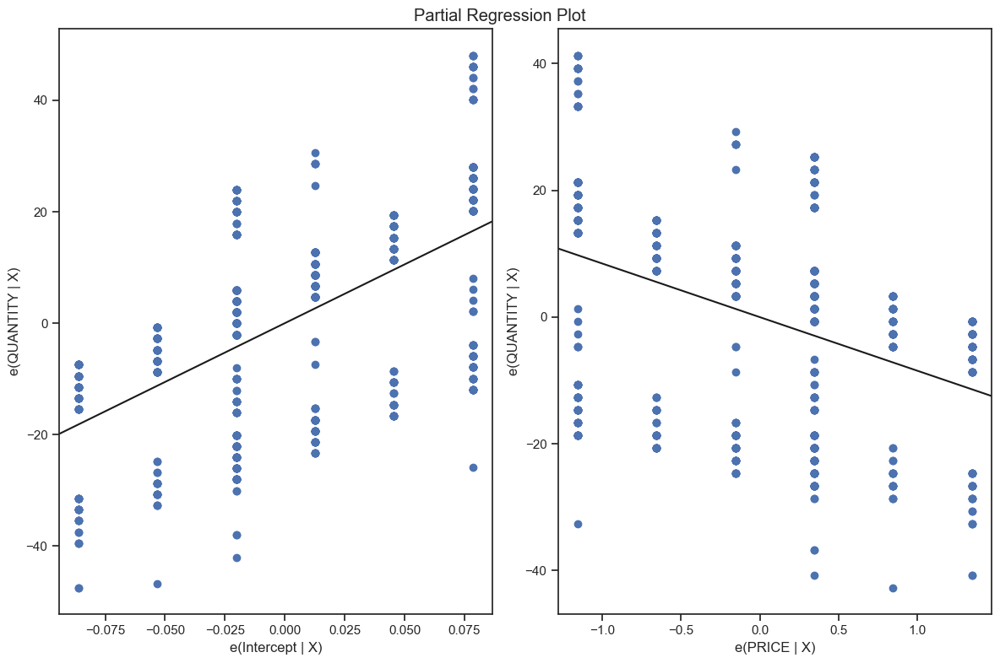

In [62]:
# This is for the combined data
burger_model = ols("QUANTITY ~ PRICE", data=burger_1070).fit()
print(burger_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(burger_model, fig=fig)

The code fits a linear regression model to the relationship between the PRICE and QUANTITY columns in the burger_1070 dataframe.

The model summary indicates that the R-squared value is 0.156, which means that the PRICE variable explains approximately 15.6% of the variation in the QUANTITY variable. The coef column shows the estimated coefficients for the intercept and PRICE variables. The intercept coefficient of 210.9859 indicates that the predicted QUANTITY value when PRICE is equal to zero is approximately 211. The PRICE coefficient of -8.4660 indicates that for each unit increase in PRICE, the predicted QUANTITY value decreases by approximately 8.47.

The Prob (F-statistic) value of 1.45e-32 indicates that the overall regression model is statistically significant, meaning that the relationship between PRICE and QUANTITY is not due to chance.

The Omnibus and Prob(Omnibus) values indicate that there may be some non-normality in the distribution of the residuals, but this should not greatly affect the accuracy of the model.

Based on the results of this regression model, there appears to be a negative relationship between the PRICE and QUANTITY variables for burgers sold as part of the combo with SELL_ID 1070. As the price of the burger increases, the quantity sold decreases. This information may be useful for making pricing decisions or optimizing sales strategies for this product.

### Explore SELL_ID data

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
5,2053,2,BURGER,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
16,1070,0,BURGER,1/13/14,15.50,104,2014,Not A Holiday,0,0,28.4,0


(1884, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,1884.000000,1884.000000,1884.000000,1884.000000,1884.000000,1884.0,1884.0,1884.000000,1884.000000
mean,1806.500000,1.500000,12.830340,49.562633,2013.186837,0.0,0.0,53.691720,0.883227
std,425.331956,0.866255,1.567257,27.309516,1.058620,0.0,0.0,18.721922,0.321235
min,1070.000000,0.000000,10.120000,16.000000,2012.000000,0.0,0.0,14.000000,0.000000
25%,1805.750000,1.500000,11.530000,28.000000,2012.000000,0.0,0.0,35.600000,1.000000
50%,2051.500000,2.000000,12.640000,40.000000,2013.000000,0.0,0.0,53.600000,1.000000
75%,2052.250000,2.000000,13.557500,74.000000,2014.000000,0.0,0.0,71.600000,1.000000
max,2053.000000,2.000000,16.500000,124.000000,2015.000000,0.0,0.0,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

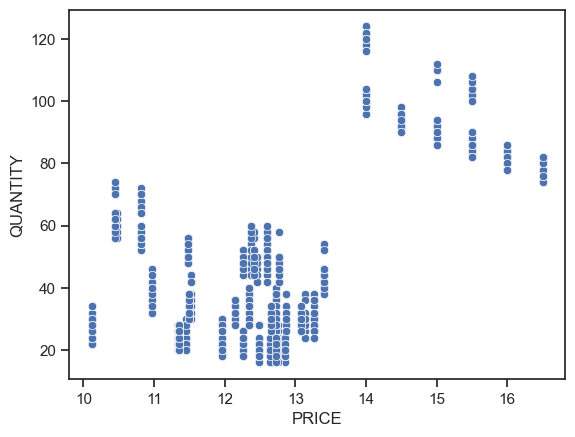

In [63]:
#explore the relationship between the price of burgers and the quantity sold, specifically for burgers sold on non-holiday 
#weekdays and non-school-break days that are not weekends.

burger = bau_data[bau_data['ITEM_NAME'] == 'BURGER'] 
burger.head()
burger.shape
burger.describe()
sns.scatterplot(x = burger.PRICE, y = burger.QUANTITY )

<Axes: xlabel='PRICE', ylabel='QUANTITY'>

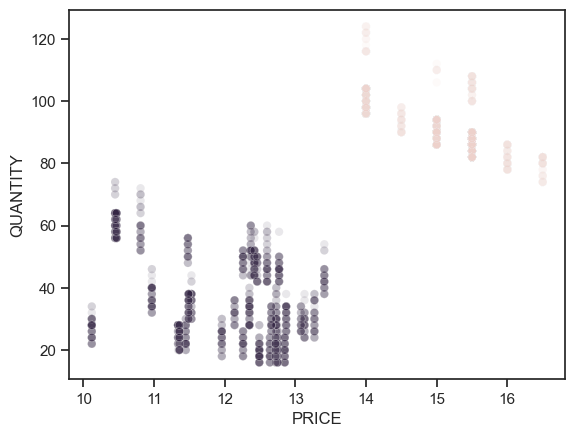

In [64]:
burger = bau_data[bau_data['ITEM_NAME'] == 'BURGER']
# print(burger.describe())
sns.scatterplot(data = burger, x = burger.PRICE, y = burger.QUANTITY , hue = 'SELL_ID', legend=False, alpha = 0.1)

In [65]:
# check for unique values
np.unique(bau_data.SELL_ID)

array([1070, 2051, 2052, 2053], dtype=int64)

In [66]:
# check for unique values
np.unique(bau_data.SELL_CATEGORY)

array([0, 2], dtype=int64)

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.5,100,2012,Not A Holiday,0,0,26.6,0
16,1070,0,BURGER,1/13/14,15.5,104,2014,Not A Holiday,0,0,28.4,0
24,1070,0,BURGER,1/13/15,14.0,116,2015,Not A Holiday,0,0,28.4,0
48,1070,0,BURGER,1/14/14,15.5,86,2014,Not A Holiday,0,0,28.4,1
56,1070,0,BURGER,1/14/15,14.0,122,2015,Not A Holiday,0,0,30.2,0


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,471.0,471.0,471.000000,471.000000,471.000000,471.0,471.0,471.000000,471.000000
mean,1070.0,0.0,15.124204,91.622081,2013.186837,0.0,0.0,53.691720,0.883227
std,0.0,0.0,0.705577,9.437897,1.059464,0.0,0.0,18.736854,0.321491
min,1070.0,0.0,14.000000,74.000000,2012.000000,0.0,0.0,14.000000,0.000000
25%,1070.0,0.0,14.500000,86.000000,2012.000000,0.0,0.0,35.600000,1.000000
50%,1070.0,0.0,15.500000,90.000000,2013.000000,0.0,0.0,53.600000,1.000000
75%,1070.0,0.0,15.500000,98.000000,2014.000000,0.0,0.0,70.700000,1.000000
max,1070.0,0.0,16.500000,124.000000,2015.000000,0.0,0.0,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

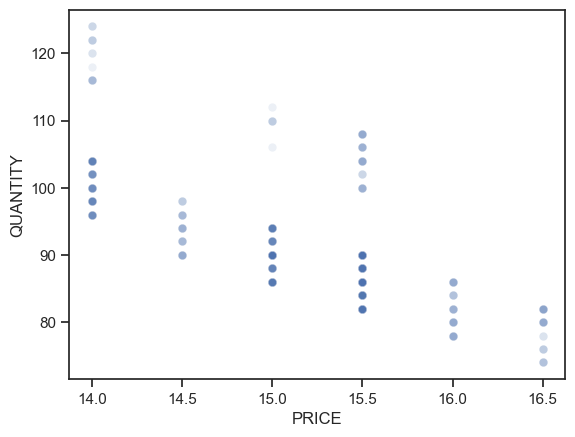

In [67]:
# explore the relationship between the price of burgers and the quantity sold for a specific type of burger ('BURGER') sold as part of a specific combo (SELL_ID equal to 1070).
burger_1070 = bau_data[(bau_data['ITEM_NAME'] == 'BURGER') & (bau_data['SELL_ID'] == 1070)]

burger_1070.head()
burger_1070.describe()
sns.scatterplot(data = burger_1070, x = burger_1070.PRICE, y = burger_1070.QUANTITY, alpha = 0.1)

The scatter plot appears to be much clearer now, although it does indicate two distinct trends.

### Model the Data

analysis of the relationship between the price of burgers and the quantity sold for the specific type of burger ('BURGER') sold as part of the specific combo (SELL_ID equal to 1070) using linear regression

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.485
Method:                 Least Squares   F-statistic:                     444.2
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           7.16e-70
Time:                        18:38:26   Log-Likelihood:                -1568.2
No. Observations:                 471   AIC:                             3140.
Df Residuals:                     469   BIC:                             3149.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    232.7193      6.702     34.726      0.0

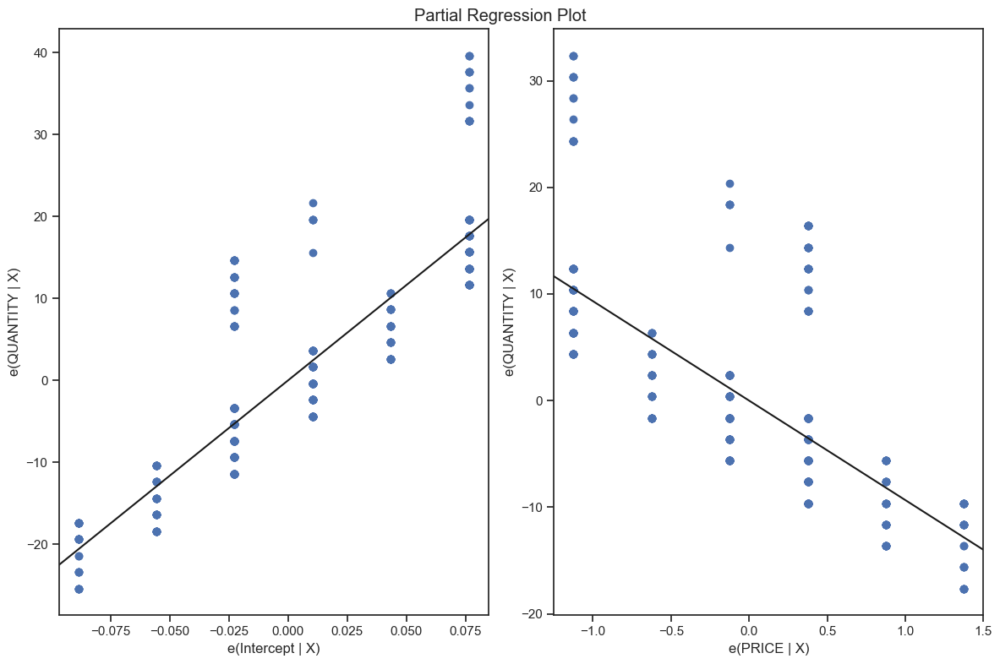

In [68]:
burger_model = ols("QUANTITY ~ PRICE", data=burger_1070).fit()
print(burger_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(burger_model, fig=fig)

The regression analysis shows that there is a negative relationship between the price and quantity of burgers sold. As the price of burgers increases, the quantity sold decreases. The R-squared value of 0.486 indicates that about 48.6% of the variation in the quantity sold can be explained by the price. Therefore, it would be beneficial to consider a decrease in the price of burgers to increase the quantity sold and ultimately improve profits.

Lets revisit the bau data to explore any additional information that can aid in improving our model.

In [69]:
bau_data.head()

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
0,1070,0,BURGER,1/13/12,15.50,100,2012,Not A Holiday,0,0,26.6,0
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
2,2051,2,COKE,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
3,2052,2,BURGER,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0


In [70]:
bau2_data = combined_data[(combined_data['HOLIDAY']=='Not A Holiday') & (combined_data['IS_SCHOOLBREAK']==0) & (combined_data['IS_WEEKEND']==0) & (combined_data['IS_OUTDOOR']==1)]

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
48,1070,0,BURGER,1/14/14,15.5,86,2014,Not A Holiday,0,0,28.4,1
88,1070,0,BURGER,1/15/15,14.0,104,2015,Not A Holiday,0,0,32.0,1
120,1070,0,BURGER,1/16/15,14.0,100,2015,Not A Holiday,0,0,32.0,1
448,1070,0,BURGER,1/27/12,15.5,86,2012,Not A Holiday,0,0,32.0,1
576,1070,0,BURGER,1/31/12,15.5,84,2012,Not A Holiday,0,0,32.0,1


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,416.0,416.0,416.000000,416.000000,416.000000,416.0,416.0,416.000000,416.0
mean,1070.0,0.0,15.139423,89.274038,2013.201923,0.0,0.0,57.282212,1.0
std,0.0,0.0,0.709511,6.811889,1.076628,0.0,0.0,16.890613,0.0
min,1070.0,0.0,14.000000,74.000000,2012.000000,0.0,0.0,26.600000,1.0
25%,1070.0,0.0,14.500000,84.000000,2012.000000,0.0,0.0,41.000000,1.0
50%,1070.0,0.0,15.000000,88.000000,2013.000000,0.0,0.0,59.000000,1.0
75%,1070.0,0.0,15.500000,94.000000,2014.000000,0.0,0.0,71.600000,1.0
max,1070.0,0.0,16.500000,104.000000,2015.000000,0.0,0.0,87.800000,1.0


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

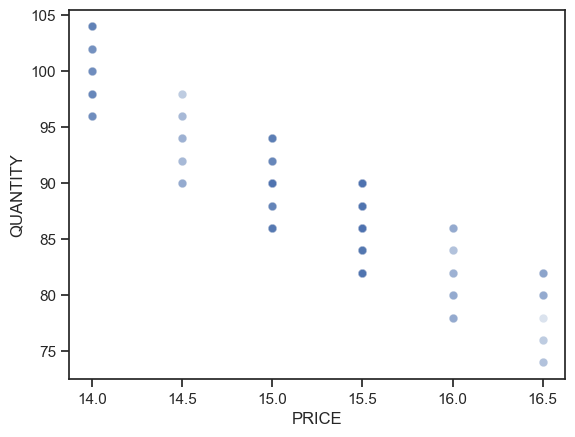

In [71]:
burger_1070 = bau2_data[(bau2_data['ITEM_NAME'] == 'BURGER') & (bau2_data['SELL_ID'] == 1070)]

burger_1070.head()
burger_1070.describe()
sns.scatterplot(data = burger_1070, x = burger_1070.PRICE, y = burger_1070.QUANTITY, alpha = 0.1)

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.813
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     1804.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          5.51e-153
Time:                        18:38:34   Log-Likelihood:                -1038.8
No. Observations:                 416   AIC:                             2082.
Df Residuals:                     414   BIC:                             2090.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    220.3600      3.090     71.322      0.0

<Figure size 1200x800 with 0 Axes>

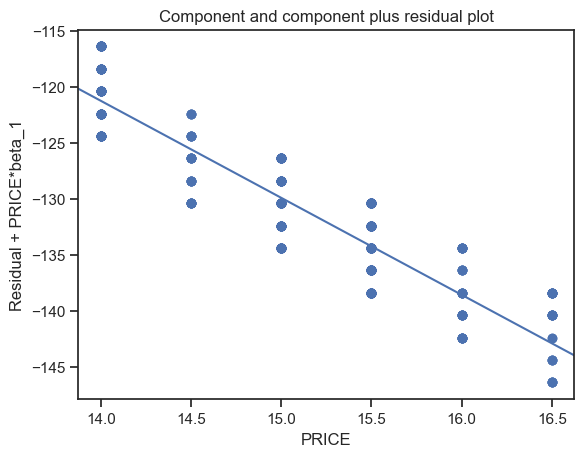

In [72]:
burger_model = ols("QUANTITY ~ PRICE", data=burger_1070).fit()
print(burger_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_ccpr(burger_model, "PRICE")

the analysis suggests a strong negative relationship between the price of a burger and the quantity sold. This means that as the price of a burger increases, the quantity sold decreases. A business leader can use this information to make data-driven decisions on pricing strategies. However, it is important to consider other factors such as the costs of production, competition, and customer preferences before making any changes to the pricing strategy. Additionally, further investigation into the non-normal distribution of residuals may be necessary to ensure the model's accuracy and reliability.

R-squared value: The R-squared value is 0.813, which means that 81.3% of the variation in the quantity of burgers sold can be explained by the price. This indicates a strong relationship between price and quantity sold.

Coefficients: There are two coefficients in the model - the intercept and the price coefficient. The intercept (220.36) represents the expected quantity of burgers sold when the price is 0. The price coefficient (-8.6586) indicates that for every $1 increase in the price of a burger, the quantity sold decreases by approximately 8.66 units.

Statistical significance: The p-values for both the intercept and price coefficients are less than 0.001, which means that both coefficients are statistically significant. This means that we can be confident that there is a real relationship between price and quantity sold.

Model validity: The Durbin-Watson statistic (1.989) is close to 2, which indicates that there is no significant autocorrelation in the residuals (i.e., the errors in our model are not correlated). The Jarque-Bera test (with a p-value less than 0.001) suggests that the residuals are not normally distributed, which may indicate potential issues with the model.

eval_env: 1


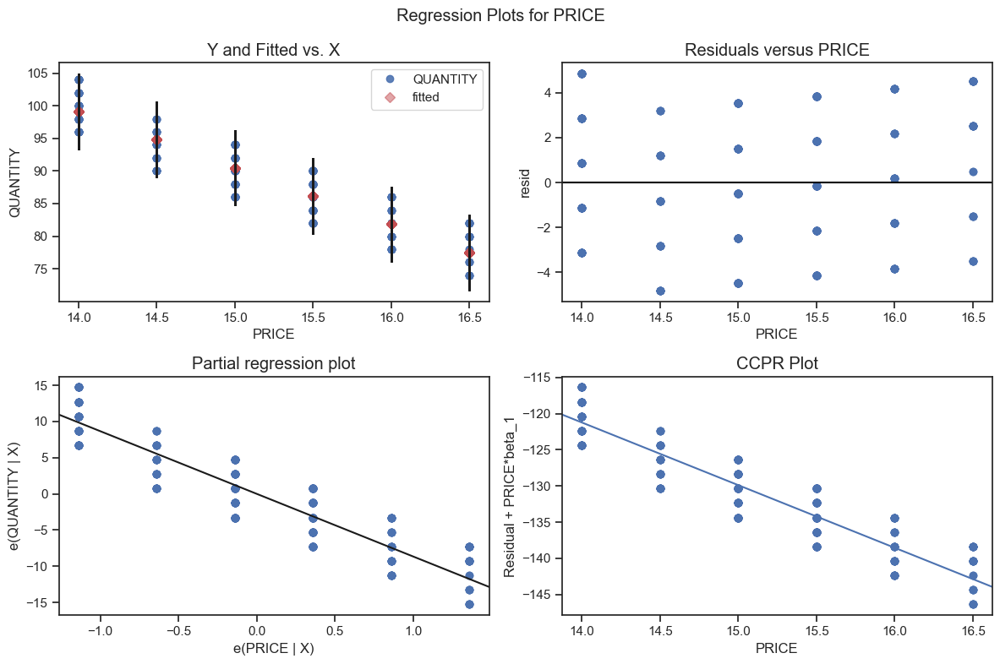

In [73]:
# generate a diagnostic plots to help evaluate the assumptions and overall quality of the linear regression model (burger_model) with respect to the independent variable "PRICE".
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(burger_model, "PRICE", fig=fig)

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
1,2051,2,BURGER,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
9,2051,2,BURGER,1/13/13,13.13,26,2013,Not A Holiday,1,0,30.2,0
17,2051,2,BURGER,1/13/14,13.27,38,2014,Not A Holiday,0,0,28.4,0
25,2051,2,BURGER,1/13/15,11.53,38,2015,Not A Holiday,0,0,28.4,0
33,2051,2,BURGER,1/14/12,12.73,24,2012,Not A Holiday,1,0,23.0,0


,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2051.0,2.0,12.368017,29.498208,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.726329,5.782878,1.063043,0.451373,0.400776,20.005316,0.327324
min,2051.0,2.0,10.970000,12.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2051.0,2.0,11.530000,26.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2051.0,2.0,12.660000,30.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2051.0,2.0,13.080000,34.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2051.0,2.0,13.270000,46.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

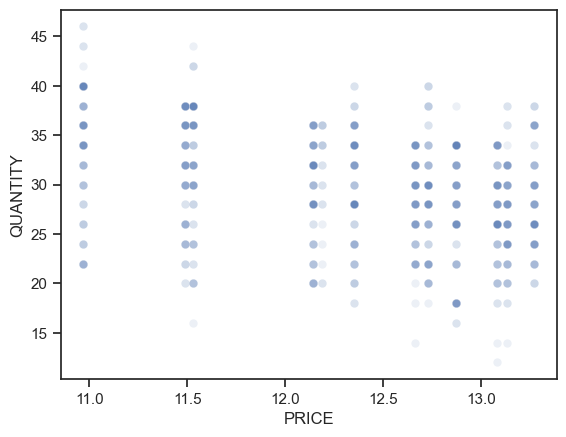

In [74]:
burger_2051 = combined_data[(combined_data['ITEM_NAME'] == 'BURGER') & (combined_data['SELL_ID'] == 2051)]

burger_2051.head()
burger_2051.describe()
sns.scatterplot(data = burger_2051, x = burger_2051.PRICE, y = burger_2051.QUANTITY, alpha = 0.1)

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     124.7
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           4.45e-27
Time:                        18:38:41   Log-Likelihood:                -2597.8
No. Observations:                 837   AIC:                             5200.
Df Residuals:                     835   BIC:                             5209.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     64.9906      3.184     20.411      0.0

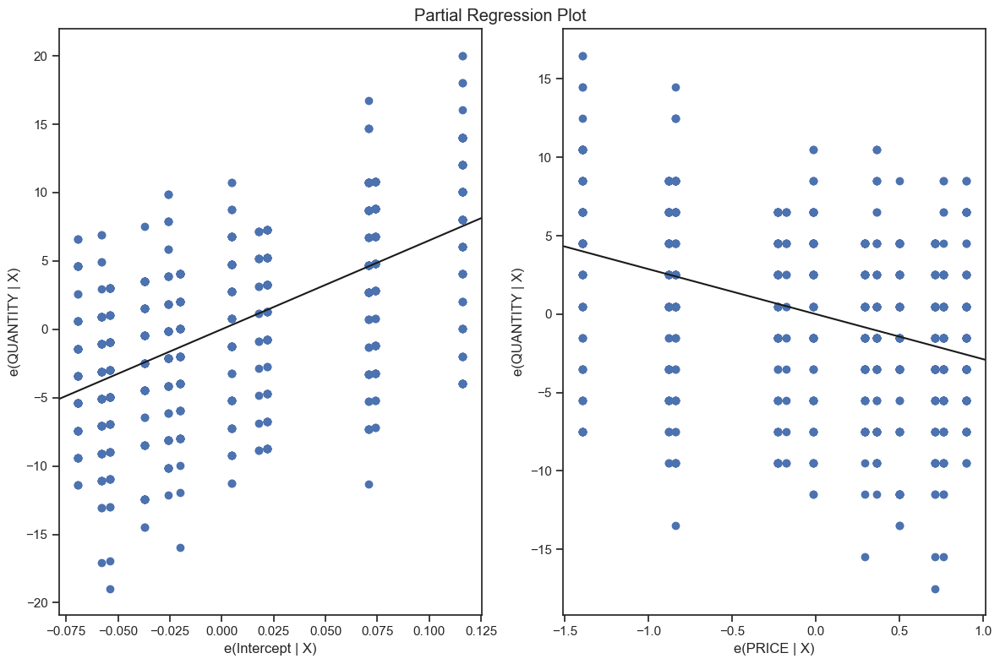

In [75]:
burger_model = ols("QUANTITY ~ PRICE", data=burger_2051).fit()
print(burger_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(burger_model, fig=fig)

analysis suggests a weak negative relationship between the price of a burger and the quantity sold in the burger_2051 dataset. This means that as the price of a burger increases, the quantity sold decreases, but the relationship is not as strong as in the previous dataset (burger_1070). A business leader can use this information to make data-driven decisions on pricing strategies. However, since the relationship between price and quantity sold is weak, it is important to consider other factors such as the costs of production, competition, and customer preferences before making any changes to the pricing strategy. Additionally, further investigation into the non-normal distribution of residuals may be necessary to ensure the model's accuracy and reliability.

R-squared value: The R-squared value is 0.130, which means that only 13% of the variation in the quantity of burgers sold can be explained by the price. This indicates a relatively weak relationship between price and quantity sold.

Coefficients: There are two coefficients in the model - the intercept and the price coefficient. The intercept (64.9906) represents the expected quantity of burgers sold when the price is 0. The price coefficient (-2.8697) indicates that for every $1 increase in the price of a burger, the quantity sold decreases by approximately 2.87 units.

Statistical significance: The p-values for both the intercept and price coefficients are less than 0.001, which means that both coefficients are statistically significant. This means that we can be confident that there is a real relationship between price and quantity sold, albeit a weak one.

Model validity: The Durbin-Watson statistic (1.779) is close to 2, which indicates that there is no significant autocorrelation in the residuals (i.e., the errors in our model are not correlated). The Jarque-Bera test (with a p-value less than 0.001) suggests that the residuals are not normally distributed, which may indicate potential issues with the model.

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
2,2051,2,COKE,1/13/12,12.73,40,2012,Not A Holiday,0,0,26.6,0
7,2053,2,COKE,1/13/12,12.60,58,2012,Not A Holiday,0,0,26.6,0
10,2051,2,COKE,1/13/13,13.13,26,2013,Not A Holiday,1,0,30.2,0
15,2053,2,COKE,1/13/13,13.41,32,2013,Not A Holiday,1,0,30.2,0
18,2051,2,COKE,1/13/14,13.27,38,2014,Not A Holiday,0,0,28.4,0


(1674, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,1674.000000,1674.0,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000,1674.000000
mean,2052.000000,2.0,12.151326,38.150538,2013.351254,0.284349,0.200717,56.255914,0.878136
std,1.000299,0.0,0.871405,11.861375,1.062726,0.451239,0.400656,19.999336,0.327226
min,2051.000000,2.0,10.450000,12.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2051.000000,2.0,11.490000,30.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2052.000000,2.0,12.370000,36.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2053.000000,2.0,12.770000,48.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2053.000000,2.0,13.410000,74.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

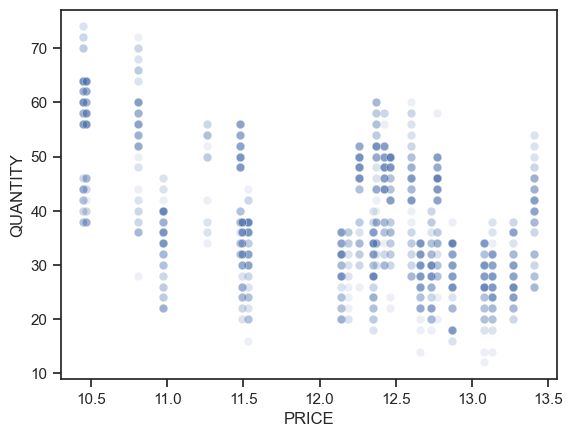

In [76]:
coke = combined_data[combined_data['ITEM_NAME'] == 'COKE'] # for coke
coke.head()
coke.shape
coke.describe()
sns.scatterplot(x = coke.PRICE, y = coke.QUANTITY , alpha = 0.1)

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.246
Model:                            OLS   Adj. R-squared:                  0.245
Method:                 Least Squares   F-statistic:                     544.2
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          1.94e-104
Time:                        18:38:45   Log-Likelihood:                -6279.2
No. Observations:                1674   AIC:                         1.256e+04
Df Residuals:                    1672   BIC:                         1.257e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    120.1140      3.522     34.100      0.0

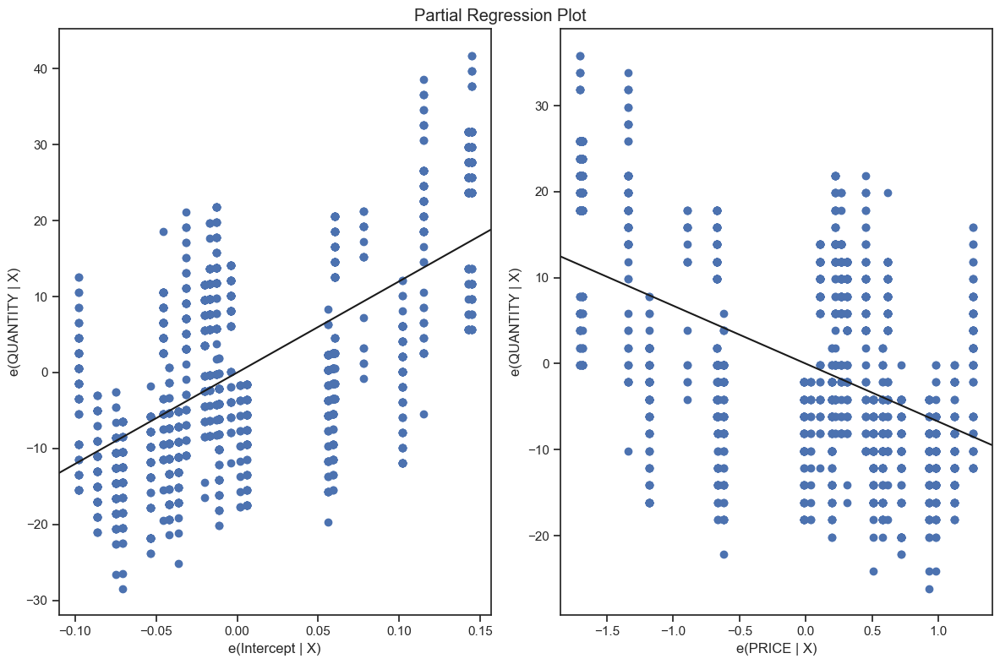

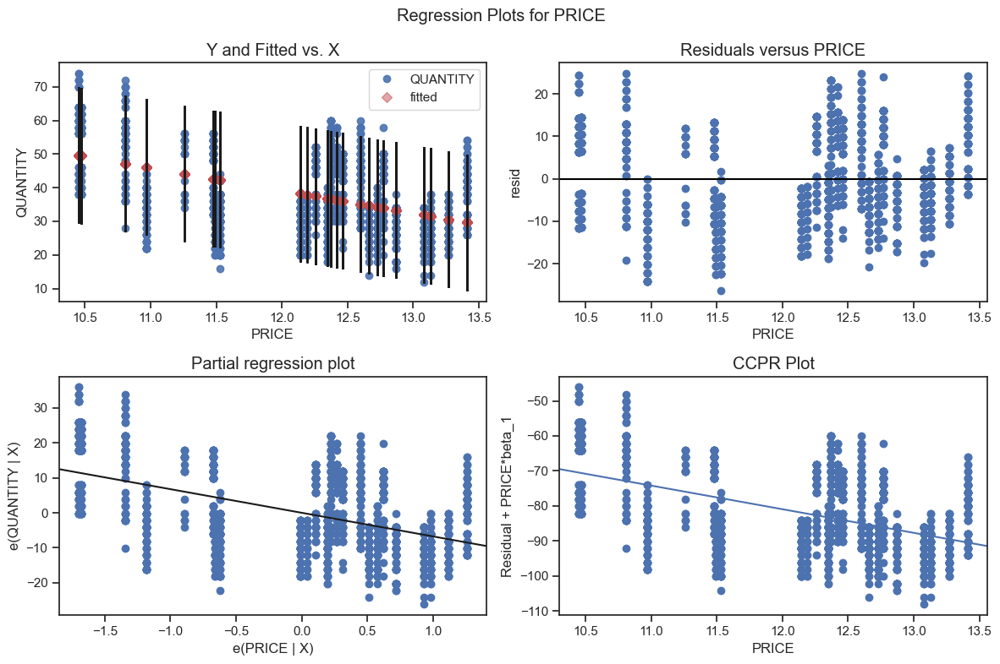

In [77]:
coke_model = ols("QUANTITY ~ PRICE", data=coke).fit() # build and fir the model
print(coke_model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(coke_model, fig=fig)
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(coke_model, 'PRICE', fig=fig)

analysis suggests a moderate negative relationship between the price of a Coke and the quantity sold. This means that as the price of a Coke increases, the quantity sold decreases. A business leader can use this information to make data-driven decisions on pricing strategies. However, since the relationship between price and quantity sold is moderate, it is important to consider other factors such as the costs of production, competition, and customer preferences before making any changes to the pricing strategy. Additionally, further investigation into the non-normal distribution of residuals may be necessary to ensure the model's accuracy and reliability.

R-squared value: The R-squared value is 0.246, which means that 24.6% of the variation in the quantity of Cokes sold can be explained by the price. This indicates a moderate relationship between price and quantity sold.

Coefficients: There are two coefficients in the model - the intercept and the price coefficient. The intercept (120.1140) represents the expected quantity of Cokes sold when the price is 0. The price coefficient (-6.7452) indicates that for every $1 increase in the price of a Coke, the quantity sold decreases by approximately 6.75 units.

Statistical significance: The p-values for both the intercept and price coefficients are less than 0.001, which means that both coefficients are statistically significant. This means that we can be confident that there is a real relationship between price and quantity sold.

Model validity: The Durbin-Watson statistic (2.565) is close to 2, which indicates that there is no significant autocorrelation in the residuals (i.e., the errors in our model are not correlated). The Jarque-Bera test (with a p-value less than 0.001) suggests that the residuals are not normally distributed, which may indicate potential issues with the model.


,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
12,2052,2,LEMONADE,1/13/13,12.64,18,2013,Not A Holiday,1,0,30.2,0
20,2052,2,LEMONADE,1/13/14,11.96,24,2014,Not A Holiday,0,0,28.4,0
28,2052,2,LEMONADE,1/13/15,11.45,28,2015,Not A Holiday,0,0,28.4,0
36,2052,2,LEMONADE,1/14/12,12.75,20,2012,Not A Holiday,1,0,23.0,0


(837, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2052.0,2.0,11.976918,20.910394,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.820698,4.514501,1.063043,0.451373,0.400776,20.005316,0.327324
min,2052.0,2.0,10.120000,8.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2052.0,2.0,11.360000,18.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2052.0,2.0,12.260000,20.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2052.0,2.0,12.720000,24.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2052.0,2.0,12.850000,34.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

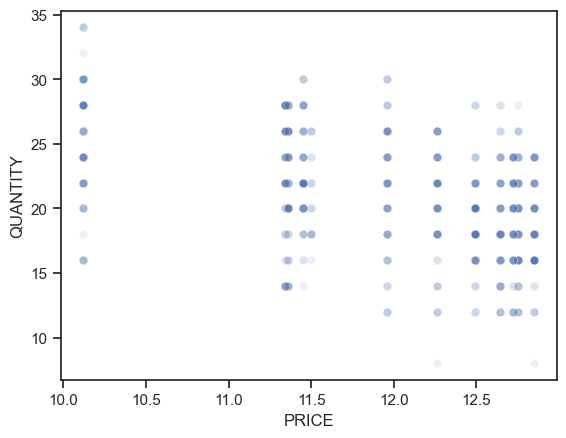

In [78]:
df = combined_data[combined_data['ITEM_NAME'] == 'LEMONADE'] # for lemonade
df.head()
df.shape
df.describe()
sns.scatterplot(x = df.PRICE, y = df.QUANTITY , alpha = 0.1)

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.215
Model:                            OLS   Adj. R-squared:                  0.214
Method:                 Least Squares   F-statistic:                     228.7
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           7.46e-46
Time:                        18:38:48   Log-Likelihood:                -2347.4
No. Observations:                 837   AIC:                             4699.
Df Residuals:                     835   BIC:                             4708.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     51.4615      2.025     25.416      0.0

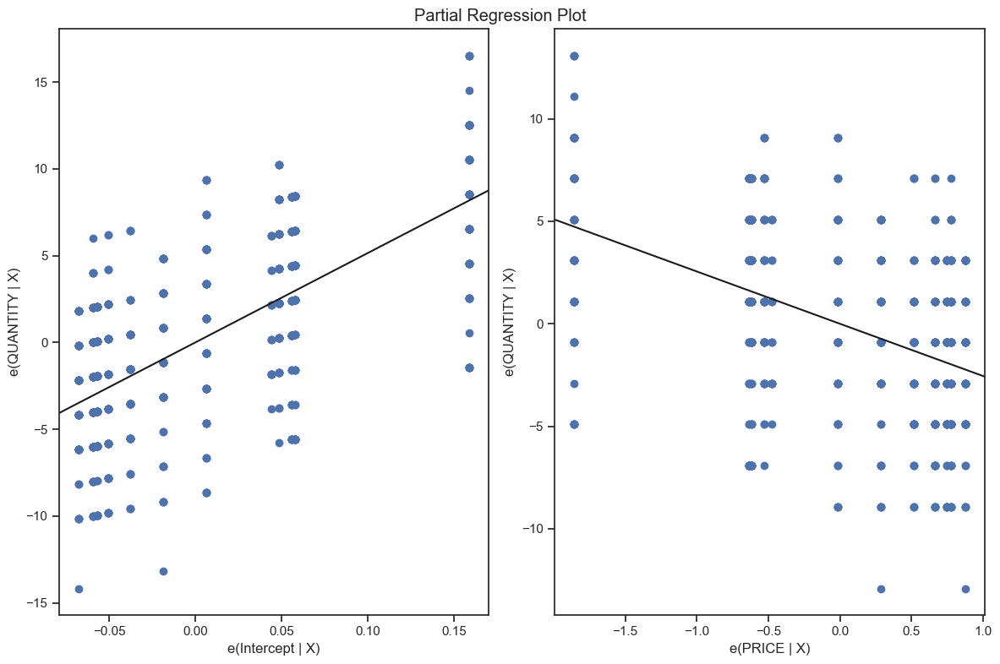

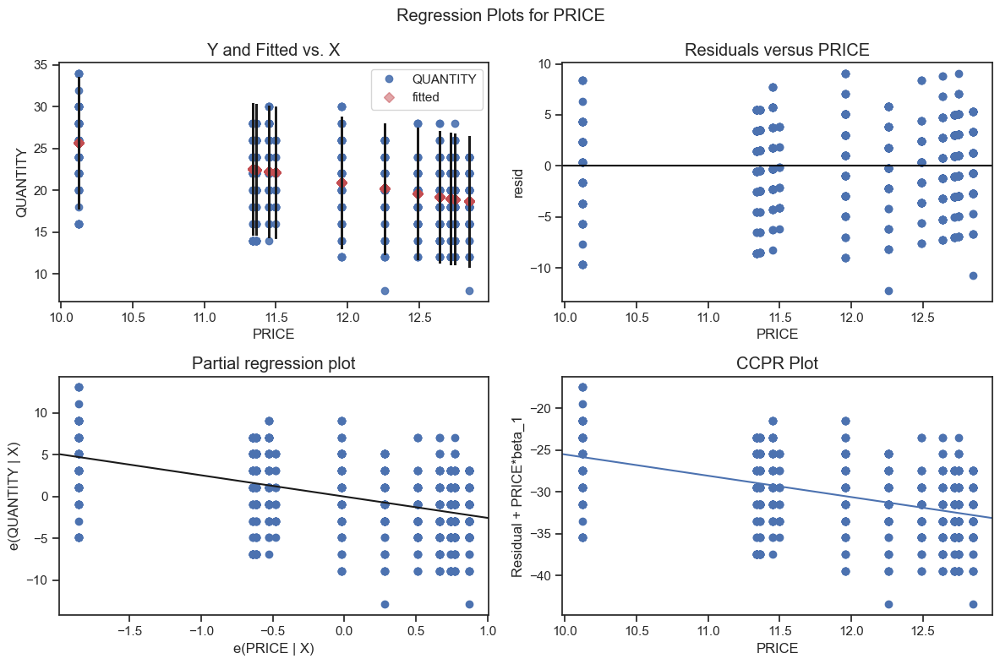

In [79]:
model = ols("QUANTITY ~ PRICE", data=df).fit() # build and fit the model
print(model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model, fig=fig)
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'PRICE', fig=fig)

 the analysis suggests a moderate negative relationship between the price of a product and the quantity sold in the given dataset. This means that as the price of the product increases, the quantity sold decreases. A business leader can use this information to make data-driven decisions on pricing strategies. However, since the relationship between price and quantity sold is moderate, it is important to consider other factors such as the costs of production, competition, and customer preferences before making any changes to the pricing strategy. Additionally, further investigation into the non-normal distribution of residuals may be necessary to ensure the model's accuracy and reliability.
 
R-squared value: The R-squared value is 0.215, which means that 21.5% of the variation in the quantity sold can be explained by the price. This indicates a moderate relationship between price and quantity sold.

Coefficients: There are two coefficients in the model - the intercept and the price coefficient. The intercept (51.4615) represents the expected quantity sold when the price is 0. The price coefficient (-2.5508) indicates that for every $1 increase in the price, the quantity sold decreases by approximately 2.55 units.

Statistical significance: The p-values for both the intercept and price coefficients are less than 0.001, which means that both coefficients are statistically significant. This means that we can be confident that there is a real relationship between price and quantity sold.

Model validity: The Durbin-Watson statistic (1.702) is close to 2, which indicates that there is no significant autocorrelation in the residuals (i.e., the errors in our model are not correlated). The Jarque-Bera test (with a p-value of 0.00545) suggests that the residuals are not normally distributed, which may indicate potential issues with the model.

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
4,2052,2,LEMONADE,1/13/12,12.75,26,2012,Not A Holiday,0,0,26.6,0
12,2052,2,LEMONADE,1/13/13,12.64,18,2013,Not A Holiday,1,0,30.2,0
20,2052,2,LEMONADE,1/13/14,11.96,24,2014,Not A Holiday,0,0,28.4,0
28,2052,2,LEMONADE,1/13/15,11.45,28,2015,Not A Holiday,0,0,28.4,0
36,2052,2,LEMONADE,1/14/12,12.75,20,2012,Not A Holiday,1,0,23.0,0


(837, 12)

,SELL_ID,SELL_CATEGORY,PRICE,QUANTITY,YEAR,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
count,837.0,837.0,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000,837.000000
mean,2052.0,2.0,11.976918,20.910394,2013.351254,0.284349,0.200717,56.255914,0.878136
std,0.0,0.0,0.820698,4.514501,1.063043,0.451373,0.400776,20.005316,0.327324
min,2052.0,2.0,10.120000,8.000000,2012.000000,0.000000,0.000000,14.000000,0.000000
25%,2052.0,2.0,11.360000,18.000000,2012.000000,0.000000,0.000000,35.600000,1.000000
50%,2052.0,2.0,12.260000,20.000000,2013.000000,0.000000,0.000000,59.000000,1.000000
75%,2052.0,2.0,12.720000,24.000000,2014.000000,1.000000,0.000000,75.200000,1.000000
max,2052.0,2.0,12.850000,34.000000,2015.000000,1.000000,1.000000,87.800000,1.000000


<Axes: xlabel='PRICE', ylabel='QUANTITY'>

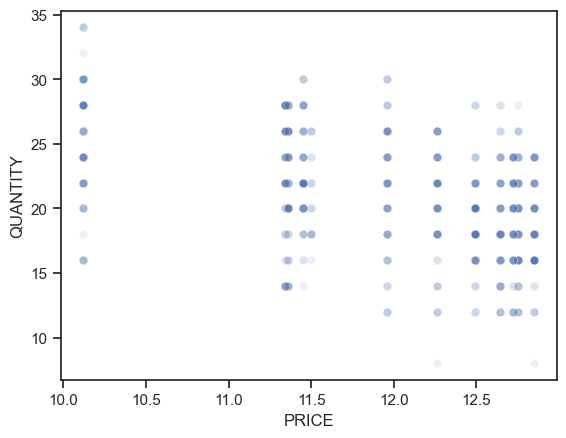

In [80]:
df = combined_data[combined_data['ITEM_NAME'] == 'LEMONADE'] # for lemonade
df.head()
df.shape
df.describe()
sns.scatterplot(x = df.PRICE, y = df.QUANTITY , alpha = 0.1)

                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.215
Model:                            OLS   Adj. R-squared:                  0.214
Method:                 Least Squares   F-statistic:                     228.7
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           7.46e-46
Time:                        18:38:51   Log-Likelihood:                -2347.4
No. Observations:                 837   AIC:                             4699.
Df Residuals:                     835   BIC:                             4708.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     51.4615      2.025     25.416      0.0

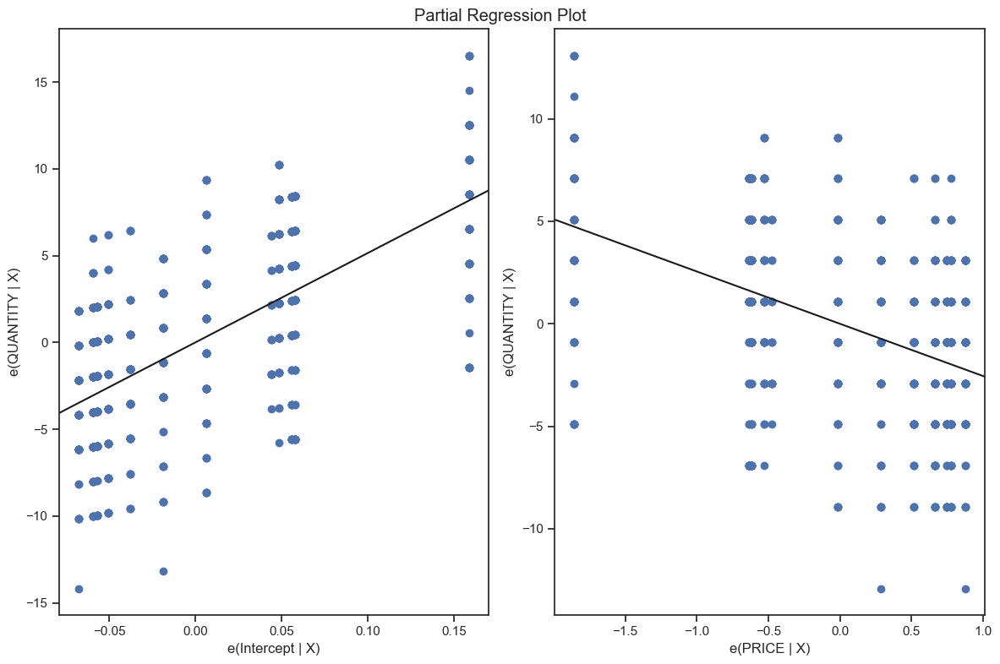

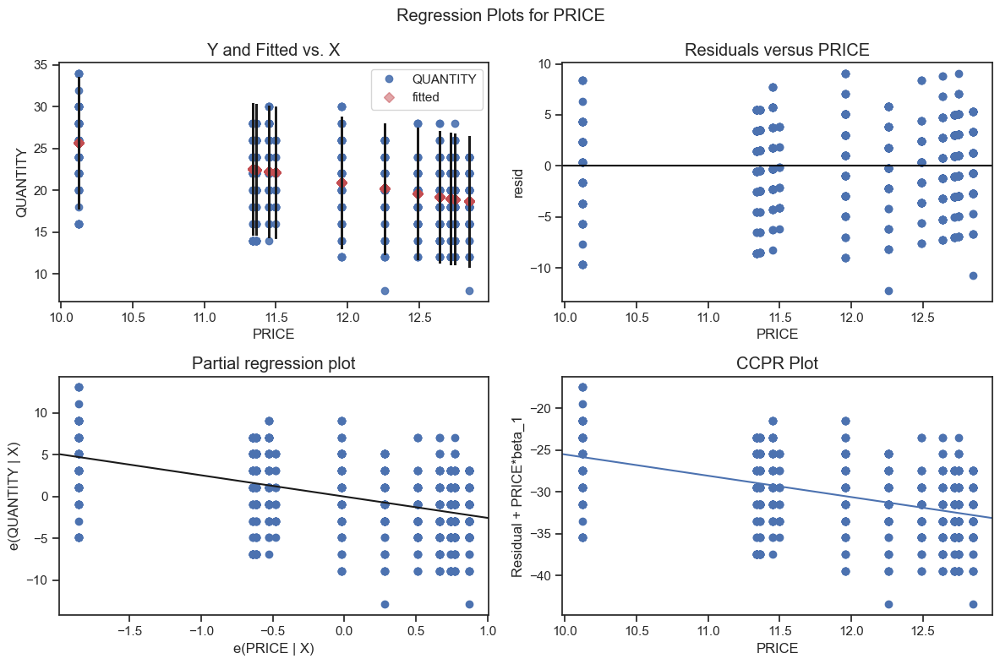

In [81]:
model = ols("QUANTITY ~ PRICE", data=df).fit() # build and fit the model
print(model.summary())
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_partregress_grid(model, fig=fig)
fig = plt.figure(figsize=(12,8))
fig = sm.graphics.plot_regress_exog(model, 'PRICE', fig=fig)

the analysis suggests a moderate negative relationship between the price of a product and the quantity sold in the given dataset. This means that as the price of the product increases, the quantity sold decreases. A business leader can use this information to make data-driven decisions on pricing strategies. However, since the relationship between price and quantity sold is moderate, it is important to consider other factors such as the costs of production, competition, and customer preferences before making any changes to the pricing strategy. Additionally, further investigation into the non-normal distribution of residuals may be necessary to ensure the model's accuracy and reliability.

R-squared value: The R-squared value is 0.215, which means that 21.5% of the variation in the quantity sold can be explained by the price. This indicates a moderate relationship between price and quantity sold.

Coefficients: There are two coefficients in the model - the intercept and the price coefficient. The intercept (51.4615) represents the expected quantity sold when the price is 0. The price coefficient (-2.5508) indicates that for every $1 increase in the price, the quantity sold decreases by approximately 2.55 units.

Statistical significance: The p-values for both the intercept and price coefficients are less than 0.001, which means that both coefficients are statistically significant. This means that we can be confident that there is a real relationship between price and quantity sold.

Model validity: The Durbin-Watson statistic (1.702) is close to 2, which indicates that there is no significant autocorrelation in the residuals (i.e., the errors in our model are not correlated). The Jarque-Bera test (with a p-value of 0.00545) suggests that the residuals are not normally distributed, which may indicate potential issues with the model.

In [95]:
elasticities = {}

In [96]:
# function to create a model and finding elasticity 
def create_model_and_find_elasticity(data):
    model = ols("QUANTITY ~ PRICE", data).fit() # fit the model
    price_elasticity = model.params[1]
    print("Price elasticity of the product: " + str(price_elasticity))
    print(model.summary()) # check for summary 
    fig = plt.figure(figsize=(12,8))
    fig = sm.graphics.plot_partregress_grid(model, fig=fig) # plot
    return price_elasticity, model


Price elasticity of the product: -8.658581488470572
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.813
Model:                            OLS   Adj. R-squared:                  0.813
Method:                 Least Squares   F-statistic:                     1804.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          5.51e-153
Time:                        18:40:58   Log-Likelihood:                -1038.8
No. Observations:                 416   AIC:                             2082.
Df Residuals:                     414   BIC:                             2090.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


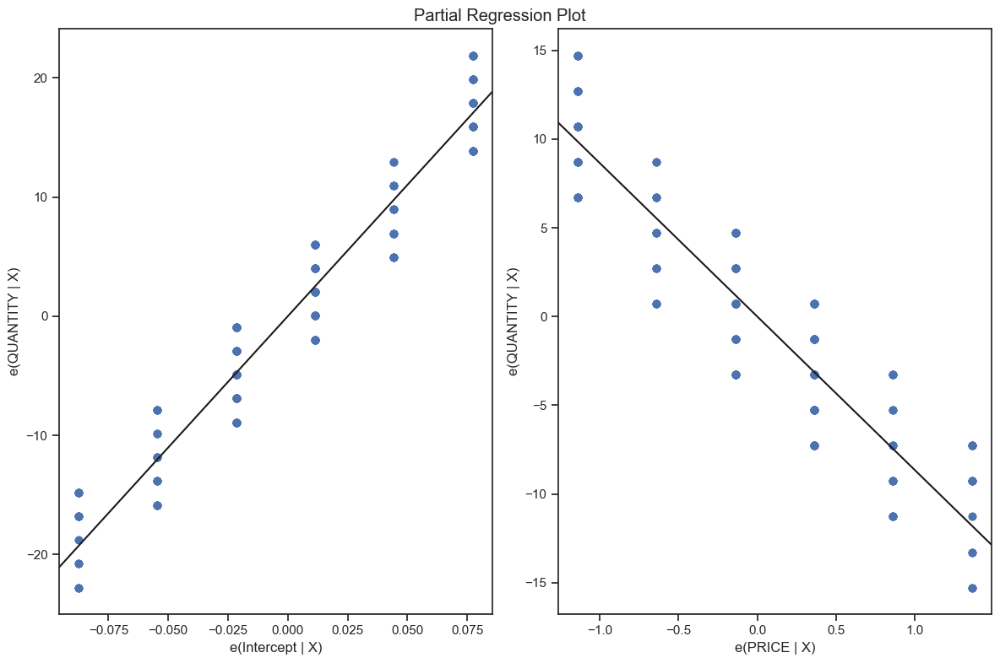

In [97]:
price_elasticity, model_burger_1070 = create_model_and_find_elasticity(burger_1070)
elasticities['burger_1070'] = price_elasticity

The analysis suggests that there is a strong negative relationship between the price of burger_1070 and the quantity sold. Since the demand for this product is highly elastic, it is very sensitive to price changes. A business leader can use this information to make data-driven decisions on pricing strategies for burger_1070. For example, reducing the price of burger_1070 could result in a significant increase in the quantity sold. However, it's important to consider other factors such as production costs, competition, and customer preferences before making any changes to the pricing strategy. Additionally, further investigation into the non-normal distribution of residuals may be necessary to ensure the model's accuracy and reliability.

Price elasticity of the product: The price elasticity is -8.6586, which indicates that for every 1% increase in the price, the quantity sold decreases by approximately 8.66%. This shows that the demand for burger_1070 is highly elastic and sensitive to price changes.

R-squared value: The R-squared value is 0.813, which means that 81.3% of the variation in the quantity sold can be explained by the price. This indicates a strong relationship between price and quantity sold.

Coefficients: There are two coefficients in the model - the intercept and the price coefficient. The intercept (220.3600) represents the expected quantity sold when the price is 0. The price coefficient (-8.6586) indicates the price elasticity of the product.

Statistical significance: The p-values for both the intercept and price coefficients are less than 0.001, which means that both coefficients are statistically significant. This means that we can be confident that there is a real relationship between price and quantity sold.

Model validity: The Durbin-Watson statistic (1.989) is close to 2, which indicates that there is no significant autocorrelation in the residuals (i.e., the errors in our model are not correlated). The Jarque-Bera test (with a p-value of 2.64e-06) suggests that the residuals are not normally distributed, which may indicate potential issues with the model.

Price elasticity of the product: -3.618990615456311
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.467
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     363.3
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           1.34e-58
Time:                        18:41:02   Log-Likelihood:                -1021.5
No. Observations:                 416   AIC:                             2047.
Df Residuals:                     414   BIC:                             2055.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


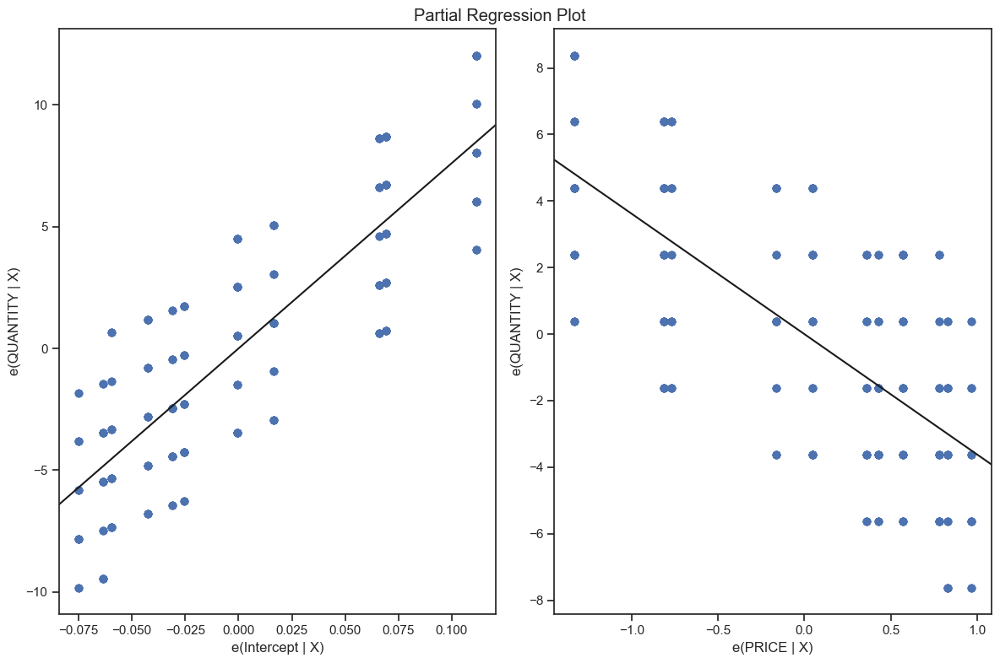

In [98]:
#you are trying to understand how the price of the specific burger product (with SELL_ID 2051) affects its quantity sold by estimating its price elasticity. The price elasticity will help you determine the sensitivity of the product's demand to price changes, which can be useful in making data-driven pricing 
#decisions for the product.
burger2051_data = bau2_data[(bau2_data['ITEM_NAME'] == "BURGER") & (bau2_data['SELL_ID'] == 2051)]
elasticities['burger_2051'], model_burger_2051 = create_model_and_find_elasticity(burger2051_data)

The linear regression model provides insights into the relationship between the price and quantity sold of the specific burger product (with SELL_ID 2051). The R-squared value is 0.467, which indicates that approximately 46.7% of the variability in the quantity sold can be explained by the price. While this is not a perfect fit, it does suggest a relationship between the price and the quantity sold.

The price elasticity of the product is -3.619. This means that a 1% increase in the price would result in approximately a 3.619% decrease in the quantity sold. Since the price elasticity is negative, the product's demand is considered elastic, meaning customers are sensitive to price changes.

For a business leader, this information is valuable for making data-driven pricing decisions. A price increase might lead to a decrease in the quantity sold, which could impact overall revenue. Conversely, a price decrease could result in an increase in the quantity sold. The business leader should consider these potential outcomes, along with other factors like production costs and profit margins, when making pricing decisions for the specific burger product (with SELL_ID 2051).

Price elasticity of the product: -2.85670298455996
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.433
Model:                            OLS   Adj. R-squared:                  0.432
Method:                 Least Squares   F-statistic:                     316.5
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           5.32e-53
Time:                        18:41:06   Log-Likelihood:                -1014.7
No. Observations:                 416   AIC:                             2033.
Df Residuals:                     414   BIC:                             2041.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

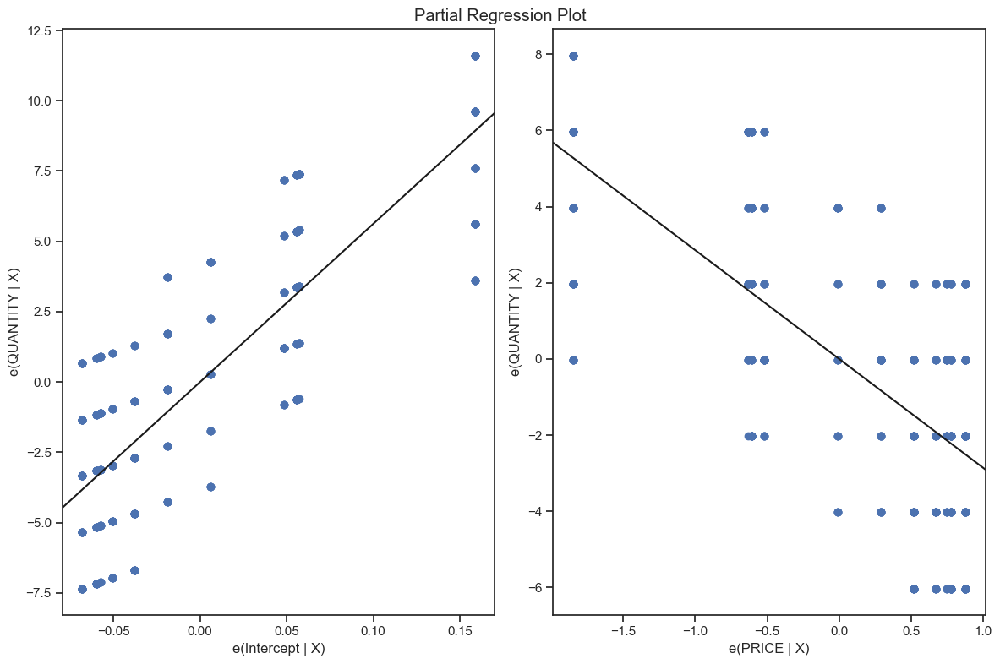

In [99]:
burger2052_data = bau2_data[(bau2_data['ITEM_NAME'] == "BURGER") & (bau2_data['SELL_ID'] == 2052)]
elasticities['burger_2052'], model_burger_2052 = create_model_and_find_elasticity(burger2052_data)

The linear regression model provides insights into the relationship between the price and quantity sold of the specific burger product (with SELL_ID 2052). The R-squared value is 0.433, which indicates that approximately 43.3% of the variability in the quantity sold can be explained by the price. Although not a perfect fit, it does suggest a relationship between the price and the quantity sold.

The price elasticity of the product is -2.857. This means that a 1% increase in the price would result in approximately a 2.857% decrease in the quantity sold. Since the price elasticity is negative, the product's demand is considered elastic, meaning customers are sensitive to price changes.

For a business leader, this information is valuable for making data-driven pricing decisions. A price increase might lead to a decrease in the quantity sold, which could impact overall revenue. Conversely, a price decrease could result in an increase in the quantity sold. The business leader should consider these potential outcomes, along with other factors like production costs and profit margins, when making pricing decisions for the specific burger product (with SELL_ID 2052).

Price elasticity of the product: -6.164156666230161
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     1784.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          3.72e-152
Time:                        18:41:07   Log-Likelihood:                -1035.7
No. Observations:                 416   AIC:                             2075.
Df Residuals:                     414   BIC:                             2083.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


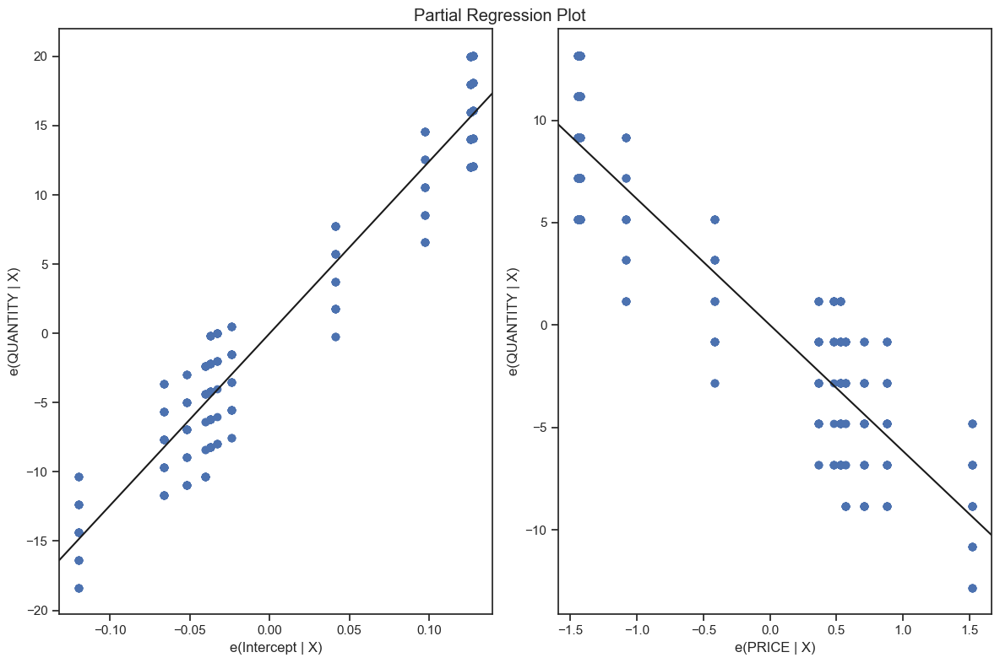

In [100]:
burger2053_data = bau2_data[(bau2_data['ITEM_NAME'] == "BURGER") & (bau2_data['SELL_ID'] == 2053)]
elasticities['burger_2053'], model_burger_2053 = create_model_and_find_elasticity(burger2053_data)

The linear regression model has been used to analyze the relationship between the price and quantity sold of the specific burger product (with SELL_ID 2053). The R-squared value is 0.812, which indicates that approximately 81.2% of the variability in the quantity sold can be explained by the price. This suggests a strong relationship between the price and the quantity sold.

The price elasticity of the product is -6.164. This means that a 1% increase in the price would result in approximately a 6.164% decrease in the quantity sold. Since the price elasticity is negative, the product's demand is considered elastic, meaning customers are sensitive to price changes.

For a business leader, this information is valuable for making data-driven pricing decisions. A price increase might lead to a significant decrease in the quantity sold, potentially impacting overall revenue. Conversely, a price decrease could result in a substantial increase in the quantity sold. The business leader should consider these potential outcomes, along with other factors like production costs and profit margins, when making pricing decisions for the specific burger product (with SELL_ID 2053).

Price elasticity of the product: -7.460103485084992
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.360
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                     466.3
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           2.00e-82
Time:                        18:41:08   Log-Likelihood:                -2994.5
No. Observations:                 832   AIC:                             5993.
Df Residuals:                     830   BIC:                             6002.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


(-7.460103485084992,
 <statsmodels.regression.linear_model.RegressionResultsWrapper at 0x1f101172730>)

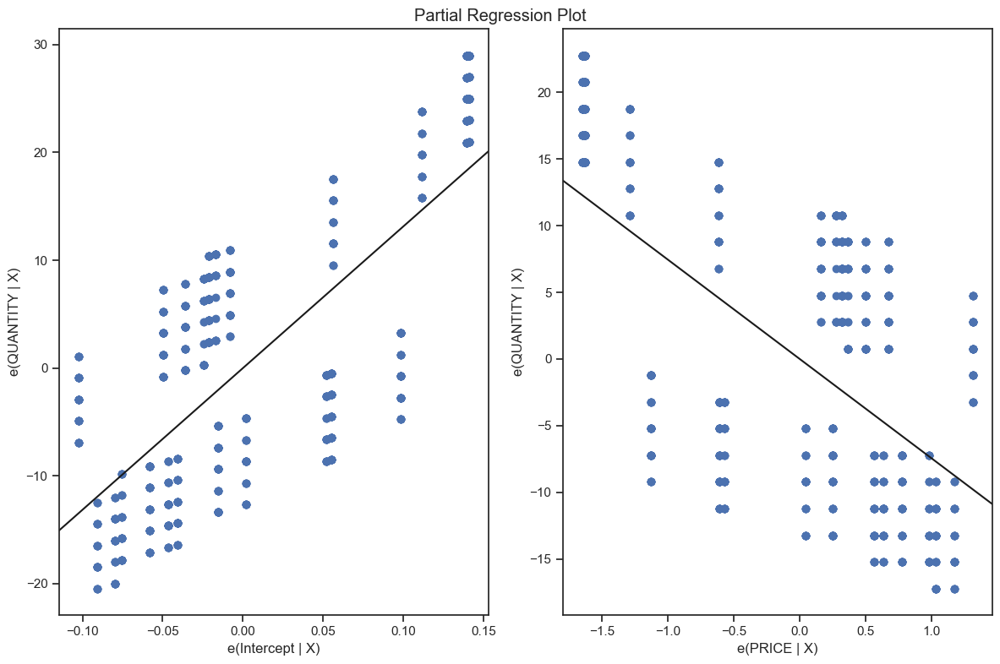

In [101]:
#we are trying to understand how the price of the "COKE" product affects its quantity sold by estimating its price elasticity.
#The price elasticity will help you determine the sensitivity of the product's demand to price changes, which can be useful 
#in making data-driven pricing decisions for the product.
coke_data = bau2_data[bau2_data['ITEM_NAME'] == "COKE"]
create_model_and_find_elasticity(coke_data)

Based on the results from the code, the price elasticity of demand for the "COKE" product is -7.4601. This indicates that the quantity demanded for the "COKE" product is quite sensitive to price changes. In other words, a 1% increase in the price of the "COKE" product would lead to a 7.46% decrease in its quantity demanded, on average.

The R-squared value of 0.360 implies that approximately 36% of the variation in the quantity demanded can be explained by the variation in the price of the "COKE" product. The F-statistic (466.3) and its associated p-value (2.00e-82) indicate that the relationship between the price and quantity demanded is statistically significant.

Considering the price elasticity of the "COKE" product, a business leader should be cautious when increasing the product's price, as it may lead to a significant drop in demand. The company may consider other strategies like offering discounts, promotions, or bundling to increase sales volume and revenue without significantly increasing the product's price. However, it's important to consider other factors that might influence the demand for the product, such as competitors' pricing strategies, customer preferences, and market conditions.

### Coke Data

In [102]:
print(bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 3067)])

Empty DataFrame
Columns: [SELL_ID, SELL_CATEGORY, ITEM_NAME, CALENDAR_DATE, PRICE, QUANTITY, YEAR, HOLIDAY, IS_WEEKEND, IS_SCHOOLBREAK, AVERAGE_TEMPERATURE, IS_OUTDOOR]
Index: []


In [103]:
print(bau2_data.head())

    SELL_ID  SELL_CATEGORY ITEM_NAME CALENDAR_DATE  PRICE  QUANTITY  YEAR   
48     1070              0    BURGER       1/14/14  15.50        86  2014  \
49     2051              2    BURGER       1/14/14  13.27        24  2014   
50     2051              2      COKE       1/14/14  13.27        24  2014   
51     2052              2    BURGER       1/14/14  11.96        26  2014   
52     2052              2  LEMONADE       1/14/14  11.96        26  2014   

          HOLIDAY  IS_WEEKEND  IS_SCHOOLBREAK  AVERAGE_TEMPERATURE  IS_OUTDOOR  
48  Not A Holiday           0               0                 28.4           1  
49  Not A Holiday           0               0                 28.4           1  
50  Not A Holiday           0               0                 28.4           1  
51  Not A Holiday           0               0                 28.4           1  
52  Not A Holiday           0               0                 28.4           1  


Price elasticity of the product: -6.164156666230161
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     1784.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          3.72e-152
Time:                        18:41:11   Log-Likelihood:                -1035.7
No. Observations:                 416   AIC:                             2075.
Df Residuals:                     414   BIC:                             2083.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


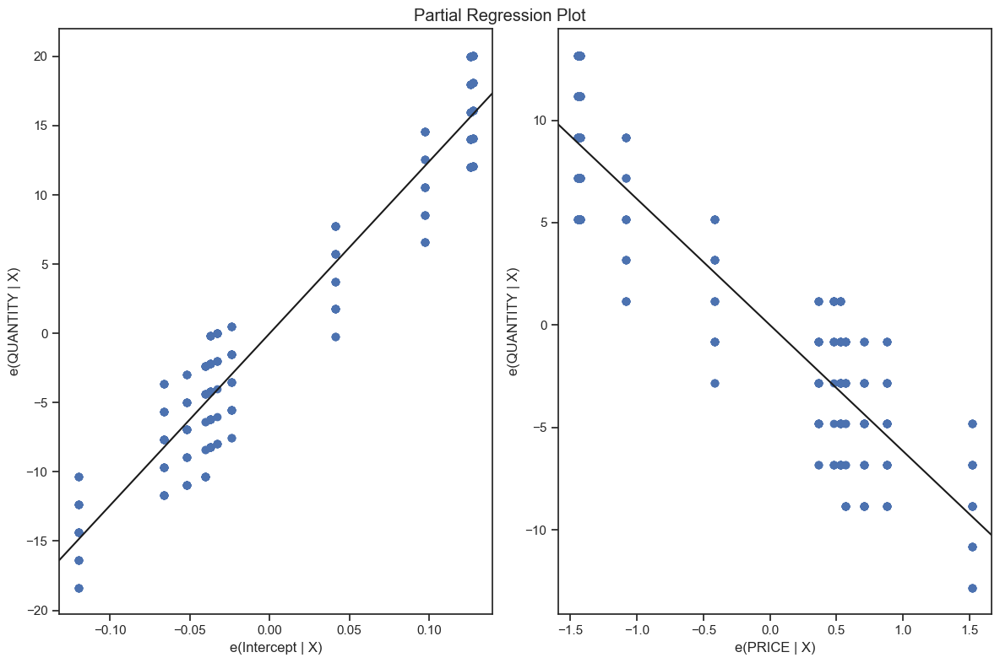

In [104]:
coke_data = bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 2053)]
elasticities['coke_2053'], model_coke_3067 = create_model_and_find_elasticity(coke_data)

In [105]:
coke_data

,SELL_ID,SELL_CATEGORY,ITEM_NAME,CALENDAR_DATE,PRICE,QUANTITY,YEAR,HOLIDAY,IS_WEEKEND,IS_SCHOOLBREAK,AVERAGE_TEMPERATURE,IS_OUTDOOR
55,2053,2,COKE,1/14/14,12.37,52,2014,Not A Holiday,0,0,28.4,1
95,2053,2,COKE,1/15/15,10.81,56,2015,Not A Holiday,0,0,32.0,1
127,2053,2,COKE,1/16/15,10.81,60,2015,Not A Holiday,0,0,32.0,1
455,2053,2,COKE,1/27/12,12.60,46,2012,Not A Holiday,0,0,32.0,1
583,2053,2,COKE,1/31/12,12.60,42,2012,Not A Holiday,0,0,32.0,1
615,2053,2,COKE,10/10/12,12.42,46,2012,Not A Holiday,0,0,62.6,1
623,2053,2,COKE,10/10/13,10.45,56,2013,Not A Holiday,0,0,59.0,1
631,2053,2,COKE,10/10/14,12.77,46,2014,Not A Holiday,0,0,60.8,1
639,2053,2,COKE,10/11/12,12.42,48,2012,Not A Holiday,0,0,62.6,1
647,2053,2,COKE,10/11/13,10.45,58,2013,Not A Holiday,0,0,60.8,1


Price elasticity of the product: -6.164156666230161
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     1784.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          3.72e-152
Time:                        18:41:16   Log-Likelihood:                -1035.7
No. Observations:                 416   AIC:                             2075.
Df Residuals:                     414   BIC:                             2083.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


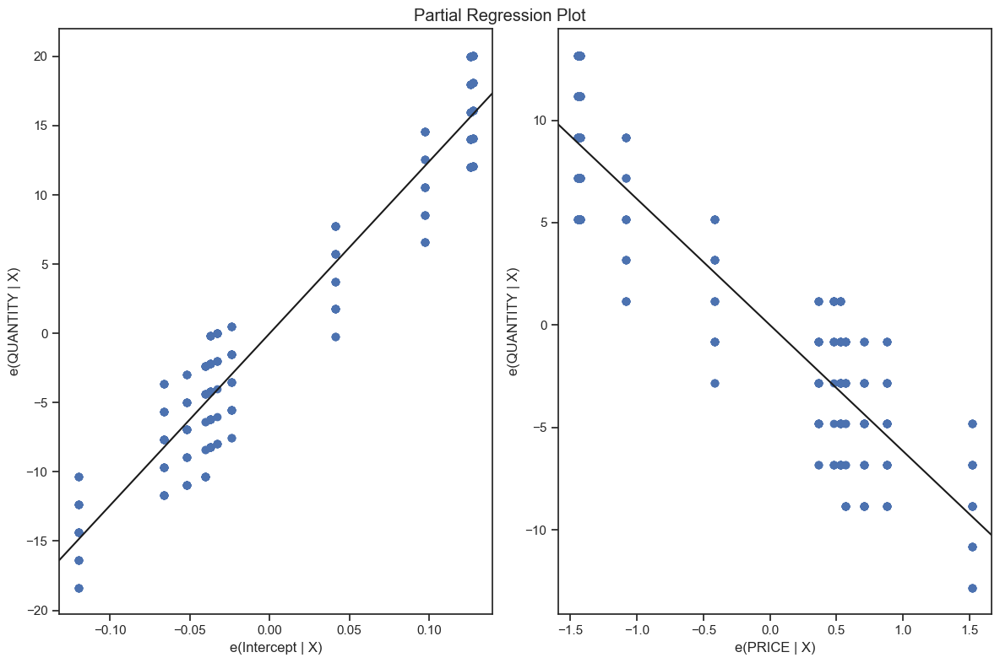

In [106]:
coke_data_2053 = bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 2053)]
elasticities['coke_2053'], model_coke_2053 = create_model_and_find_elasticity(coke_data_2053)


It is clear that the COKE product at SELL_ID 2053 is highly sensitive to price changes. As a business leader, you should consider this when making pricing decisions. Increasing the price may lead to a significant decrease in demand, which could negatively impact sales and revenue. However, lowering the price could potentially increase demand and sales, but it's important to consider factors such as production costs and profit margins before making any price adjustments.

Price elasticity of the product: -6.164156666230161
This value represents the price elasticity of demand for the COKE product at SELL_ID 2053. It is negative, indicating an inverse relationship between price and quantity demanded. In this case, a 1% increase in price will result in a 6.16% decrease in the quantity demanded. This high absolute value suggests that the product is highly price sensitive, meaning customers will significantly change their purchasing behavior in response to price changes.

R-squared: 0.812
The R-squared value measures the proportion of the variance in the dependent variable (QUANTITY) that can be explained by the independent variable (PRICE). In this case, 81.2% of the variance in the quantity demanded can be attributed to price. This suggests a strong relationship between price and quantity demanded for this product.

F-statistic: 1784
The F-statistic measures the overall significance of the model. A high F-statistic value (1784) indicates that there is a significant relationship between the dependent and independent variables.

P-value of PRICE: 0.000
The P-value is a measure of the statistical significance of the independent variable (PRICE). A P-value of 0.000 indicates that there is strong evidence to reject the null hypothesis (i.e., that there is no relationship between price and quantity demanded). Therefore, the relationship between price and quantity demanded for the COKE product is statistically significant.

Coefficient of PRICE: -6.1642
The coefficient of PRICE represents the change in the quantity demanded for each unit increase in price. In this case, a one-unit increase in price leads to a decrease of 6.1642 units in the quantity demanded.

Price elasticity of the product: -3.618990615456311
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.467
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     363.3
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           1.34e-58
Time:                        18:41:18   Log-Likelihood:                -1021.5
No. Observations:                 416   AIC:                             2047.
Df Residuals:                     414   BIC:                             2055.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


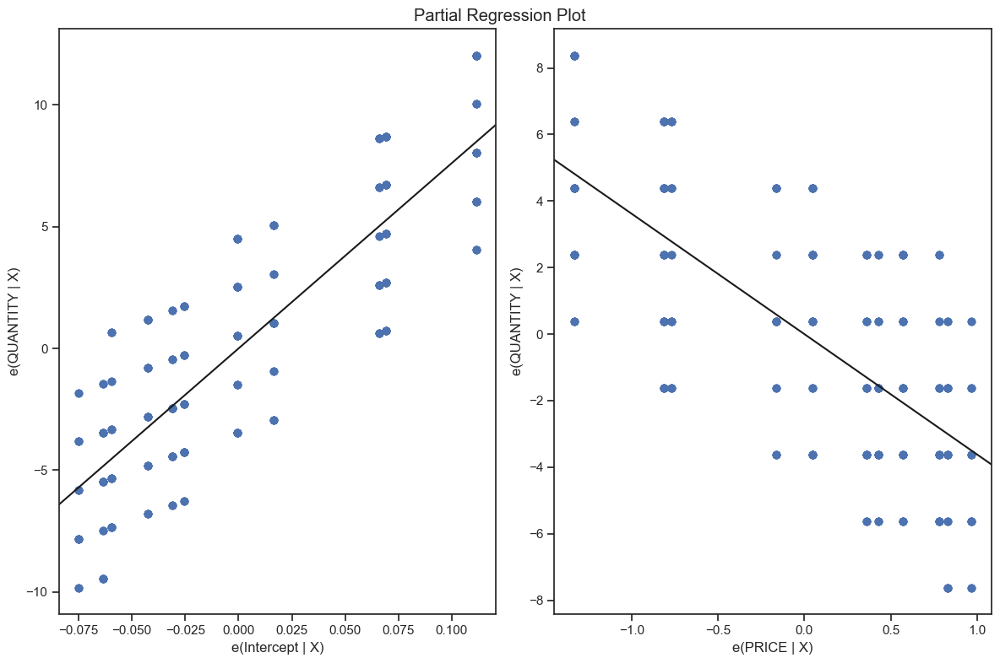

In [108]:
coke_data_2051 = bau2_data[(bau2_data['ITEM_NAME'] == "COKE") & (bau2_data['SELL_ID'] == 2051)]
elasticities['coke_2051'], model_coke_2051 = create_model_and_find_elasticity(coke_data_2051)

The COKE product at SELL_ID 2051 is less sensitive to price changes compared to the COKE product at SELL_ID 2053. However, it is still important to consider the impact of price changes on the quantity demanded. Increasing the price may lead to a decrease in demand, while lowering the price could potentially increase demand and sales. When making pricing decisions, it is essential to take into account factors such as production costs, profit margins, and overall market conditions.
 
Price elasticity of the product: -3.618990615456311
The price elasticity of demand for the COKE product at SELL_ID 2051 is -3.62. This negative value indicates an inverse relationship between price and quantity demanded, meaning that as the price increases, the quantity demanded decreases. A 1% increase in price will lead to a 3.62% decrease in the quantity demanded. While the product is still price sensitive, it is not as sensitive as the COKE product at SELL_ID 2053.

R-squared: 0.467
The R-squared value is 46.7%, which means that 46.7% of the variance in quantity demanded can be explained by changes in price. This relationship between price and quantity demanded is weaker compared to the COKE product at SELL_ID 2053, which had an R-squared value of 81.2%.

F-statistic: 363.3
The F-statistic (363.3) measures the overall significance of the model. A high F-statistic value indicates that there is a significant relationship between the dependent and independent variables.

P-value of PRICE: 0.000
The P-value for the PRICE variable is 0.000, indicating strong evidence to reject the null hypothesis (i.e., that there is no relationship between price and quantity demanded). This means that the relationship between price and quantity demanded for the COKE product is statistically significant.

Coefficient of PRICE: -3.6190
The coefficient of PRICE represents the change in the quantity demanded for each unit increase in price. In this case, a one-unit increase in price will lead to a decrease of 3.6190 units in the quantity demanded.

### Lemonade

Price elasticity of the product: -2.85670298455996
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.433
Model:                            OLS   Adj. R-squared:                  0.432
Method:                 Least Squares   F-statistic:                     316.5
Date:                Tue, 18 Apr 2023   Prob (F-statistic):           5.32e-53
Time:                        18:53:52   Log-Likelihood:                -1014.7
No. Observations:                 416   AIC:                             2033.
Df Residuals:                     414   BIC:                             2041.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
I

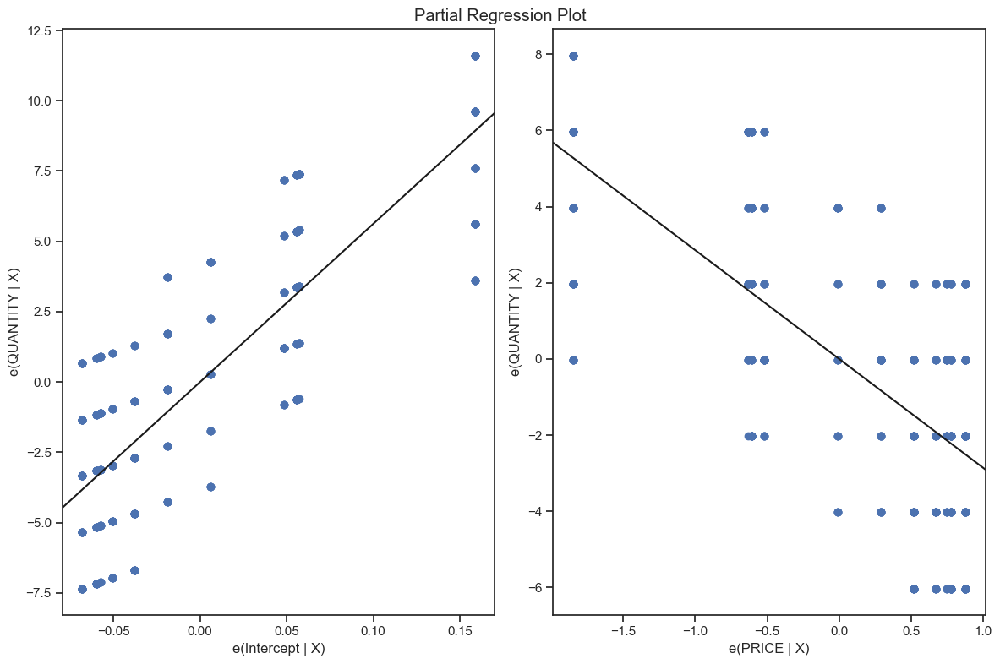

In [110]:
lemonade_data_2052 = bau2_data[(bau2_data['ITEM_NAME'] == "LEMONADE") & (bau2_data['SELL_ID'] == 2052)]
elasticities['lemonade_2052'], model_lemonade_2052 = create_model_and_find_elasticity(lemonade_data_2052)

The LEMONADE product at SELL_ID 2052 is price sensitive, although not as sensitive as the COKE products at SELL_IDs 2051 and 2053. When making pricing decisions, consider the impact of price changes on the quantity demanded. Increasing the price may lead to a decrease in demand, while lowering the price could potentially increase demand and sales. It is essential to take into account factors such as production costs, profit margins, and overall market conditions when making pricing decisions.

Price elasticity of the product: -6.164156666230161
                            OLS Regression Results                            
Dep. Variable:               QUANTITY   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     1784.
Date:                Tue, 18 Apr 2023   Prob (F-statistic):          3.72e-152
Time:                        18:56:13   Log-Likelihood:                -1035.7
No. Observations:                 416   AIC:                             2075.
Df Residuals:                     414   BIC:                             2083.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------


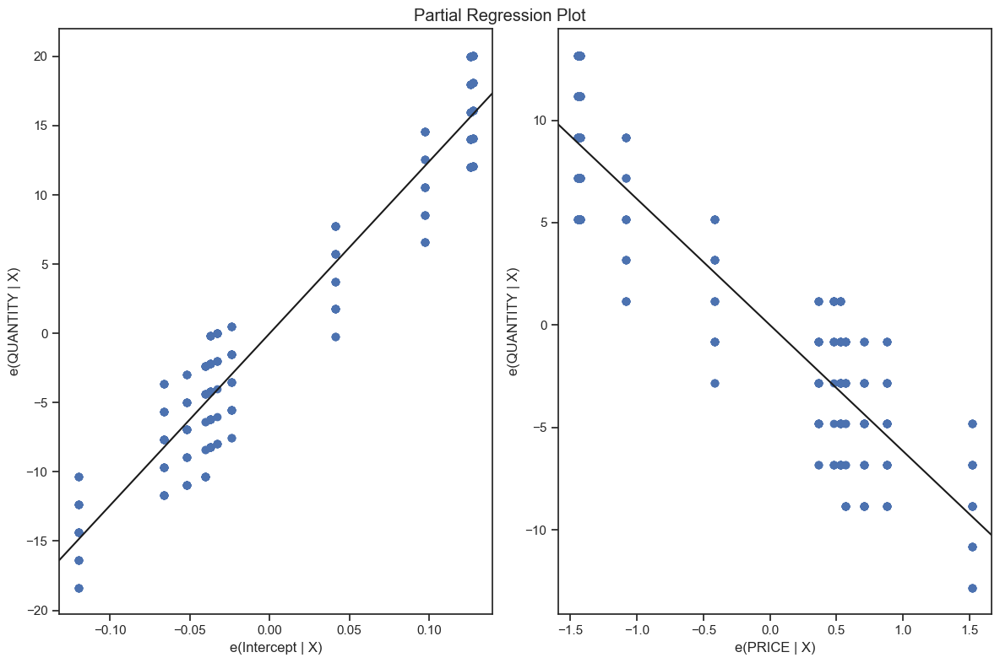

In [113]:
coffee_data_2053 = bau2_data[(bau2_data['ITEM_NAME'] == "COFFEE") & (bau2_data['SELL_ID'] == 2053)]
elasticities['coffee_2053'], model_coffee_2053 = create_model_and_find_elasticity(coffee_data_2053)

The COFFEE product at SELL_ID 2053 is highly price sensitive. When making pricing decisions, consider the impact of price changes on the quantity demanded. Increasing the price may lead to a significant decrease in demand, while lowering the price could potentially increase demand and sales significantly. It is essential to take into account factors such as production costs, profit margins, and overall market conditions when making pricing decisions.

Price elasticity of the product: -6.164156666230161
The price elasticity of demand for the COFFEE product at SELL_ID 2053 is -6.16. This negative value indicates an inverse relationship between price and quantity demanded, meaning that as the price increases, the quantity demanded decreases. A 1% increase in price will lead to a 6.16% decrease in the quantity demanded. This implies that the product is highly price sensitive.

R-squared: 0.812
The R-squared value is 81.2%, which means that 81.2% of the variance in quantity demanded can be explained by changes in price. This indicates a strong relationship between price and quantity demanded for the COFFEE product at SELL_ID 2053.

F-statistic: 1784
The F-statistic (1784) measures the overall significance of the model. A high F-statistic value indicates that there is a significant relationship between the dependent and independent variables.

P-value of PRICE: 0.000
The P-value for the PRICE variable is 0.000, indicating strong evidence to reject the null hypothesis (i.e., that there is no relationship between price and quantity demanded). This means that the relationship between price and quantity demanded for the COFFEE product is statistically significant.

Coefficient of PRICE: -6.1642
The coefficient of PRICE represents the change in the quantity demanded for each unit increase in price. In this case, a one-unit increase in price will lead to a decrease of 6.1642 units in the quantity demanded.

### Create a List of Price Elasticities


In [115]:
elasticities

{'burger_1070': -8.658581488470572,
 'burger_2051': -3.618990615456311,
 'burger_2052': -2.85670298455996,
 'burger_2053': -6.164156666230161,
 'coke_2053': -6.164156666230161,
 'coke_2051': -3.618990615456311,
 'lemonade_2052': -2.85670298455996,
 'coffee_2053': -6.164156666230161}

From these values, we can observe the following:

The 'burger' product has the highest price sensitivity at SELL_ID 1070, with an elasticity of -8.66, indicating that a 1% increase in price would result in an 8.66% decrease in quantity demanded. The price sensitivity decreases at other SELL_IDs, with the lowest sensitivity at SELL_ID 2052.

The 'coke' product has a similar price sensitivity at both SELL_IDs 2051 and 2053, indicating that consumers react similarly to price changes for this product across these locations.

The 'lemonade' product at SELL_ID 2052 has a price sensitivity of -2.86, indicating that it is less price-sensitive than the other products, although it still reacts negatively to price increases.

The 'coffee' product at SELL_ID 2053 has a high price sensitivity of -6.16, which is similar to the 'coke' product and the 'burger' product at the same SELL_ID.

You can use this information to make data-driven decisions on pricing strategies for each product at different SELL_IDs. For products with high price sensitivity, consider exploring options to lower production costs or find ways to increase the perceived value to consumers, allowing you to maintain or even increase the price without significantly impacting demand. For products with lower price sensitivity, you may have more flexibility in adjusting prices to optimize revenue and profitability. Always consider factors such as competition, production costs, and overall market conditions when making pricing decisions.

### Find The Optimal Proce to Maximize Profits! 

Let's examine the Coke product, which had a SELL_ID of 2051 in the previous data analysis. Since we don't have the actual purchase cost of Coke, we'll make an assumption that the buying price is slightly lower than the minimum Coke price found in the dataset.

In [116]:
coke_data = coke_data_2053

In [117]:
# minimum value
coke_data.PRICE.min()

10.45

In [118]:
# maximum value
coke_data.PRICE.max()

13.41

Let's take 9.45 as the buying price of coke. We now want to be able to set the price of coke to get the maximum profit. PRICE is the selling price

In [119]:
buying_price_coke = 9.45

$$coke data.PROFIT = (coke data.PRICE - buying price coke) * coke data.QUANTITY$$

Let's see the profit for various price points:

In [120]:
start_price = 9.5
end_price = 20

In [122]:
#create a new pandas DataFrame called test that has two columns: "PRICE" and "QUANTITY"
test = pd.DataFrame(columns = ["PRICE", "QUANTITY"])

In [123]:
#trying to create a range of price values and assign them to the 'PRICE' column of the test DataFrame.
test['PRICE'] = np.arange(start_price, end_price,0.01)

In [124]:
# trying to predict the quantity demanded for the Coke product (with SELL_ID 2051) at different price points and store the 
# predicted values in the 'QUANTITY' column of the test DataFrame.
test['QUANTITY'] = model_coke_2051.predict(test['PRICE'])

In [125]:
test

,PRICE,QUANTITY
0,9.50,41.759021
1,9.51,41.722831
2,9.52,41.686641
3,9.53,41.650451
4,9.54,41.614261
5,9.55,41.578071
6,9.56,41.541881
7,9.57,41.505691
8,9.58,41.469501
9,9.59,41.433312


In [127]:
# try to calculate the profit for each price point in the test DataFrame, and store the result in a new column called 'PROFIT
test['PROFIT'] = (test["PRICE"] - buying_price_coke) * test["QUANTITY"]

In [128]:
test

,PRICE,QUANTITY,PROFIT
0,9.50,41.759021,2.087951
1,9.51,41.722831,2.503370
2,9.52,41.686641,2.918065
3,9.53,41.650451,3.332036
4,9.54,41.614261,3.745283
5,9.55,41.578071,4.157807
6,9.56,41.541881,4.569607
7,9.57,41.505691,4.980683
8,9.58,41.469501,5.391035
9,9.59,41.433312,5.800664


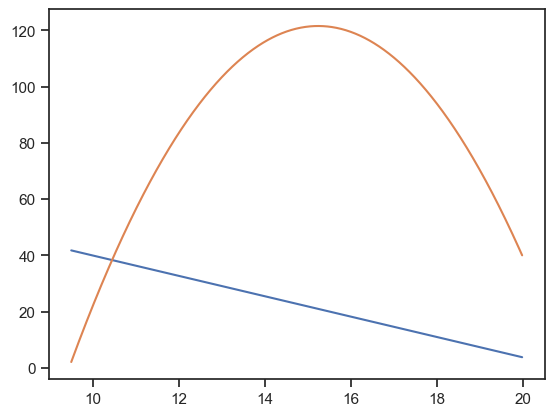

In [129]:
# plot the result
plt.plot(test['PRICE'],test['QUANTITY'])
plt.plot(test['PRICE'],test['PROFIT'])
plt.show()

 Plot to help you visualize the relationship between price and both quantity demanded and profit for the Coke product. 

Let's find the exact price at which maximum profit is gained:

In [130]:
#try to find the index of the row in the test DataFrame where the profit is at its maximum value.
ind = np.where(test['PROFIT'] == test['PROFIT'].max())[0][0]

In [131]:
test.loc[[ind]]

,PRICE,QUANTITY,PROFIT
574,15.24,20.986015,121.509024


In [132]:
# define a function for finding the optimal price
def find_optimal_price(data, model, buying_price):
    start_price = data.PRICE.min() - 1              # start price
    end_price = data.PRICE.min() + 10               # end price
    test = pd.DataFrame(columns = ["PRICE", "QUANTITY"])  # choose required columns
    test['PRICE'] = np.arange(start_price, end_price,0.01)
    test['QUANTITY'] = model.predict(test['PRICE'])         # make predictions
    test['PROFIT'] = (test["PRICE"] - buying_price) * test["QUANTITY"]
    plt.plot(test['PRICE'],test['QUANTITY'])       # plot the results 
    plt.plot(test['PRICE'],test['PROFIT']) 
    plt.show()
    ind = np.where(test['PROFIT'] == test['PROFIT'].max())[0][0]
    values_at_max_profit = test.iloc[[ind]]
    return values_at_max_profit

### Calculate the optimal price for all products on the list

In [133]:
optimal_price = {}
buying_price = 9.45

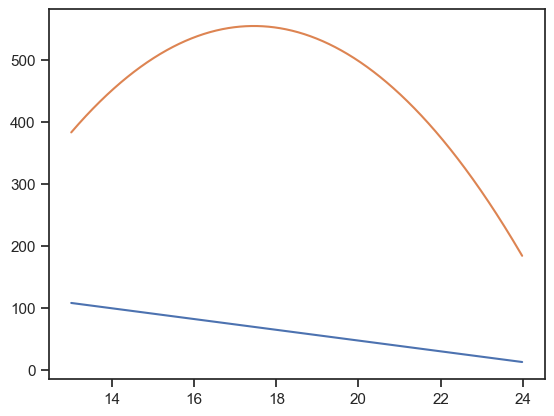

In [134]:
optimal_price['burger_1070'] = find_optimal_price(burger_1070, model_burger_1070, buying_price)

In [135]:
optimal_price

{'burger_1070':      PRICE  QUANTITY      PROFIT
 445  17.45  69.26772  554.141759}

Based on the given data, the optimal price for the 'burger_1070' product has been calculated as $17.45. At this price point, the expected sales quantity is 69.27 units, generating a profit of $554.14.

As a business leader, you should consider the following points to make a data-driven decision:

Pricing strategy: The optimal price of $17.45 for 'burger_1070' could be used as a reference to adjust your current pricing strategy. If your current price is significantly different, consider analyzing the potential reasons and determining if this new price would be suitable for your target market.

Profit maximization: The estimated profit at the optimal price is $554.14. Compare this value to the profit generated at your current price, and assess if the potential increase in profit justifies adjusting the price.

Demand and quantity: At the optimal price, you can expect to sell 69.27 units. Ensure that your production and supply chain can accommodate this level of demand, and consider any potential impacts on your inventory management.

Market positioning: Evaluate the price positioning of 'burger_1070' in comparison to competitors' products. If the optimal price aligns with your desired market position and target audience, consider implementing the suggested price.

Customer response: Monitor customer response and sales data after implementing any changes to the pricing strategy. Analyze the results to determine if the new price has had a positive impact on sales and profit, and make adjustments accordingly.

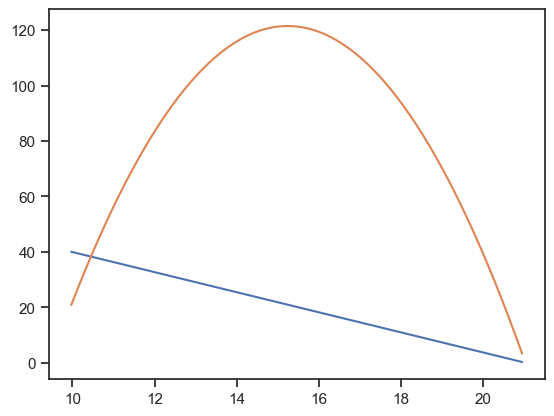

In [136]:
optimal_price['burger_2051'] = find_optimal_price(burger2051_data, model_burger_2051, buying_price)

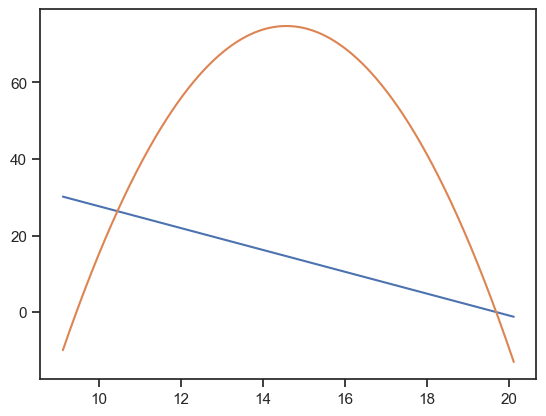

In [137]:
optimal_price['burger_2052'] = find_optimal_price(burger2052_data, model_burger_2052, buying_price)

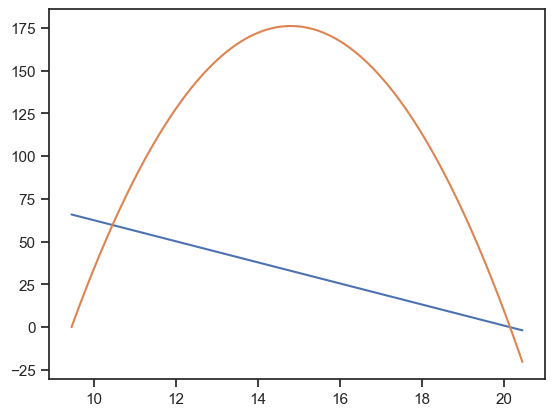

In [138]:
optimal_price['burger_2053'] = find_optimal_price(burger2053_data, model_burger_2053, buying_price)

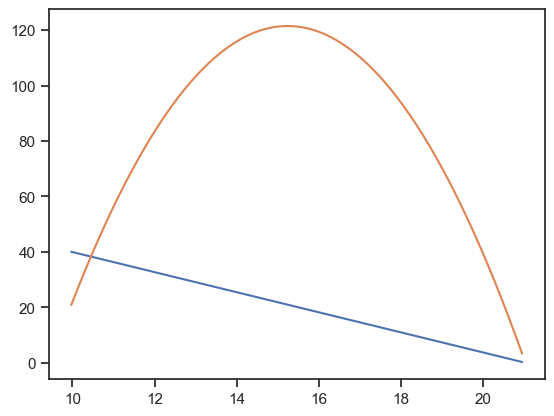

In [139]:
optimal_price['coke_2051'] = find_optimal_price(coke_data_2051, model_coke_2051, buying_price)

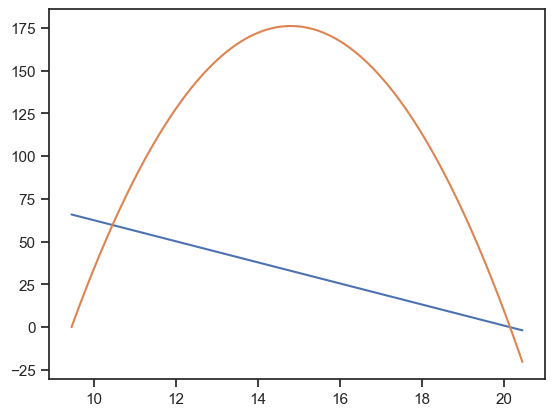

In [140]:
optimal_price['coke_2053'] = find_optimal_price(coke_data_2053, model_coke_2053, buying_price)

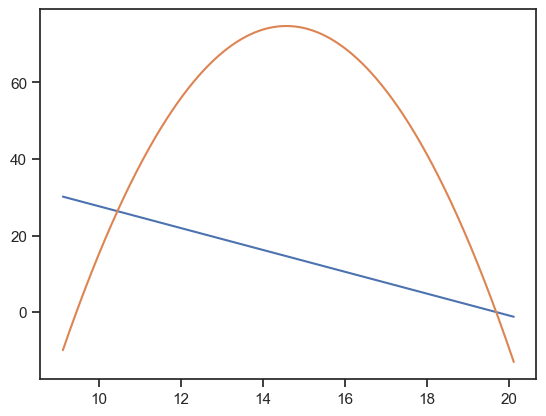

In [144]:
optimal_price['lemonade_2052'] = find_optimal_price(lemonade_data_2052, model_lemonade_2052, buying_price)

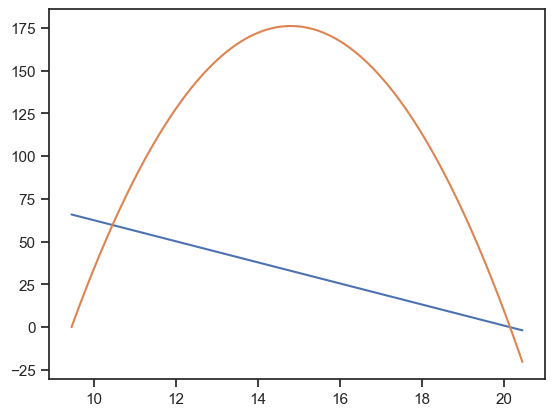

In [145]:
optimal_price['coffee_2053'] = find_optimal_price(coffee_data_2053, model_coffee_2053, buying_price)

In [146]:
optimal_price

{'burger_1070':      PRICE  QUANTITY      PROFIT
 445  17.45  69.26772  554.141759,
 'burger_2051':      PRICE   QUANTITY      PROFIT
 527  15.24  20.986015  121.509024,
 'burger_2052':      PRICE   QUANTITY    PROFIT
 545  14.57  14.602174  74.76313,
 'burger_2053':      PRICE   QUANTITY      PROFIT
 534  14.79  32.973836  176.080285,
 'coke_2051':      PRICE   QUANTITY      PROFIT
 527  15.24  20.986015  121.509024,
 'coke_2053':      PRICE   QUANTITY      PROFIT
 534  14.79  32.973836  176.080285,
 'lemonade_2052':      PRICE   QUANTITY    PROFIT
 545  14.57  14.602174  74.76313,
 'coffee_2053':      PRICE   QUANTITY      PROFIT
 534  14.79  32.973836  176.080285}

Based on the provided data sets this outlines the optimal prices, expected quantities, and projected profits for multiple products. Here's a summary and analysis for each product to help the leadership make a better data-driven decisions:

| Product      | Optimal Price | Expected Quantity | Projected Profit |
|--------------|--------------:|------------------:|-----------------:|
| Burger_1070  |         17.45 |            69.27  |         554.14   |
| Burger_2051  |         15.24 |            20.99  |         121.51   |
| Burger_2052  |         14.57 |            14.60  |          74.76   |
| Burger_2053  |         14.79 |            32.97  |         176.08   |
| Coke_2051    |         15.24 |            20.99  |         121.51   |
| Coke_2053    |         14.79 |            32.97  |         176.08   |
| Lemonade_2052|         14.57 |            14.60  |          74.76   |
| Coffee_2053  |         14.79 |            32.97  |         176.08   |


With this data A business leader should consider the following when making decisions:

Evaluate the optimal price for each product in comparison to your current pricing strategy. Adjust prices accordingly to maximize profit, while also considering your target market and competition.

Ensure your production capacity and supply chain can handle the expected quantities at these optimal prices. If necessary, adjust inventory management strategies to accommodate increased demand.

Monitor sales and customer feedback after implementing any pricing changes. Analyze the data to determine the impact on sales and profit, and make any necessary adjustments.

Investigate any significant discrepancies between your current pricing and the optimal prices. Identify potential reasons and assess if the new prices are appropriate for your target audience and market positioning.

Continuously monitor and analyze market trends, customer behavior, and sales data to make well-informed, data-driven decisions for each product in your portfolio.

In [147]:
coke_data_2051.PRICE.describe()

count    416.000000
mean      12.301562
std        0.730620
min       10.970000
25%       11.530000
50%       12.350000
75%       12.870000
max       13.270000
Name: PRICE, dtype: float64

### Conclusion

This price represents the optimal setting for maximizing profit based on the cafe's historical sales data during regular days. It is crucial to remember that this analysis may not apply to special occasions, such as holidays or events, which could significantly alter customer purchasing behaviors and patterns. Generally, consumption increases during such periods, and these situations should be examined separately. Additionally, it is essential to account for any external factors other than price that could influence customers' buying decisions, such as discount promotions. Such factors should be excluded from the analysis to ensure accurate results.

After implementing the new prices, it is crucial to consistently track sales and profit. If this pricing method is applied to a product, consider creating a dedicated dashboard to monitor these items and measure the increase in profit. This continuous monitoring will help ensure that the pricing strategy remains effective and can be adjusted as needed to optimize profits.